Paula Pena, Carlota Rufino, Lola del Brío, María Revuelta y FernandO Pocino - 4ºIngeniería Biomédica

**TRABAJO: HUMAN FACE EMOTION RECOGNITION**

Se propone la elaboración de un modelo para identificar las diferentes emociones humanas (sad, angry, happy). Las imágenes empleadas vienen proporcionadas por el siguiente link: https://www.kaggle.com/datasets/sanidhyak/human-face-emotions, en donde hay un total de 264 imágenes.
A continuación, se presenta la creación de nuestro modelo.

**IMPLEMENTACIÓN DE IMÁGENES**

Aquí exploramos la lista de los archivos de imágenes que tenemos en content/faces. Para conseguir imprimir la ruta completa de cada archivo de imagen.

In [ ]:
import numpy as np
import pandas as pd

import os
for dirname, _, filenames in os.walk('/content/faces'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


Conseguimos el directorio para acceder a las carpetas de las imágenes contenidas en Google Drive.

In [ ]:
import os
folder_path = '/content/drive/My Drive/faces'
os.chdir(folder_path)

In [ ]:
import os
for dirname, _, filenames in os.walk('/content/drive/My Drive/faces'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/My Drive/faces/Happy/7VR73K6EP5ETVEOUFANWBUYJEQ.jpg
/content/drive/My Drive/faces/Happy/2560px-Happy_People.jpg
/content/drive/My Drive/faces/Happy/05-12-21-happy-people.jpg
/content/drive/My Drive/faces/Happy/343515-worldhappinessreport1440.jpg
/content/drive/My Drive/faces/Happy/110754-utyeqqosky-1547658396.jpeg
/content/drive/My Drive/faces/Happy/20150413185238-secrets-happy-entrepreneurs-woman-gratitude-rainbow-.jpeg
/content/drive/My Drive/faces/Happy/427394C200000578-0-image-a-24_1500384481554.jpg
/content/drive/My Drive/faces/Happy/56f455011e0000b300705475.jpeg
/content/drive/My Drive/faces/Happy/5400ea_cd54b25fdd2a4216819fe49413f0c976mv2.png
/content/drive/My Drive/faces/Happy/613k1XcpYCL.jpg
/content/drive/My Drive/faces/Happy/35438_hd.jpg
/content/drive/My Drive/faces/Happy/10-Habits-of-Happy-People-Seniors-Today.jpg
/content/drive/My Drive/faces/Happy/1920px-face-smile.svg_.png.jpg
/content/drive/My Drive/faces/Happy/1HEoLBLidT2u4mhJ0oiDgig.png
/content/drive/

Aquí implementamos las bibliotecas necesarias para iniciar el código y ubicamos el directorio de datos y observamos las respectivas etiquetas de las emociones que vamos a usar.

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fastai.data.all import *
from fastai.vision.all import *

In [ ]:
data_dir = '/content/drive/My Drive/faces'
!ls "{data_dir}"

Angry  Happy  Sad


Con el siguiente código, la función devuelve dos listas: path, que contiene las rutas completas de los archivos de imagen, y labels, que contiene las etiquetas asociadas a cada imagen (nombre de la carpeta).

In [ ]:
def generate_data_paths(data_dir):
    path = []
    labels = []

    folds = os.listdir(data_dir)
    for fold in folds:
        foldpath = os.path.join(data_dir, fold)

        if os.path.isdir(foldpath):  # Comprueba si es un directorio
            filelist = os.listdir(foldpath)
            for file in filelist:
                fpath = os.path.join(foldpath, file)
                path.append(fpath)
                labels.append(fold)

    return path, labels

Este código genera un DataFrame de Pandas (Un DataFrame se puede pensar como una tabla en una base de datos relacional, donde los datos se organizan en filas y columnas) a partir de las rutas de archivos y las etiquetas asociadas.

In [ ]:
import os
import pandas as pd

# Asegúrate de que las variables path y labels estén definidas
path, labels = generate_data_paths(data_dir)

def create_df(filepaths, labels):
    Fseries = pd.Series(filepaths, name='path')
    Lseries = pd.Series(labels, name='labels')
    df = pd.concat([Fseries, Lseries], axis=1)
    return df

df = create_df(path, labels)

df.head()

,path,labels
0,/content/drive/My Drive/faces/Happy/7VR73K6EP5ETVEOUFANWBUYJEQ.jpg,Happy
1,/content/drive/My Drive/faces/Happy/2560px-Happy_People.jpg,Happy
2,/content/drive/My Drive/faces/Happy/05-12-21-happy-people.jpg,Happy
3,/content/drive/My Drive/faces/Happy/343515-worldhappinessreport1440.jpg,Happy
4,/content/drive/My Drive/faces/Happy/110754-utyeqqosky-1547658396.jpeg,Happy


 Esta función proporciona una descripción del número de imágenes en cada clase presente en el conjunto de datos. Es útil para comprender la distribución de clases en el conjunto de datos.

In [ ]:
def num_of_classes(df):
    print(f"The dataset has: ")
    print("="*50)
    print()
    for name in df['labels'].unique():
        num_class = len(df['labels'][df['labels'] == name])
        print(f"Class '{name}' has {num_class} images")
        print('-'*50)
    print(f"\nThe dataset has {len(df['labels'].unique())} classes and {df.shape[0]} images.")

num_of_classes(df)

The dataset has: 

Class 'Happy' has 100 images
--------------------------------------------------
Class 'Angry' has 86 images
--------------------------------------------------
Class 'Sad' has 79 images
--------------------------------------------------

The dataset has 3 classes and 265 images.


Realizamos una prueba para ver si detecta las imágenes con las distintas emociones. Utiliza Matplotlib para visualizar una cuadrícula de imágenes seleccionadas aleatoriamente del DataFrame df que contiene las rutas de archivo y las etiquetas.

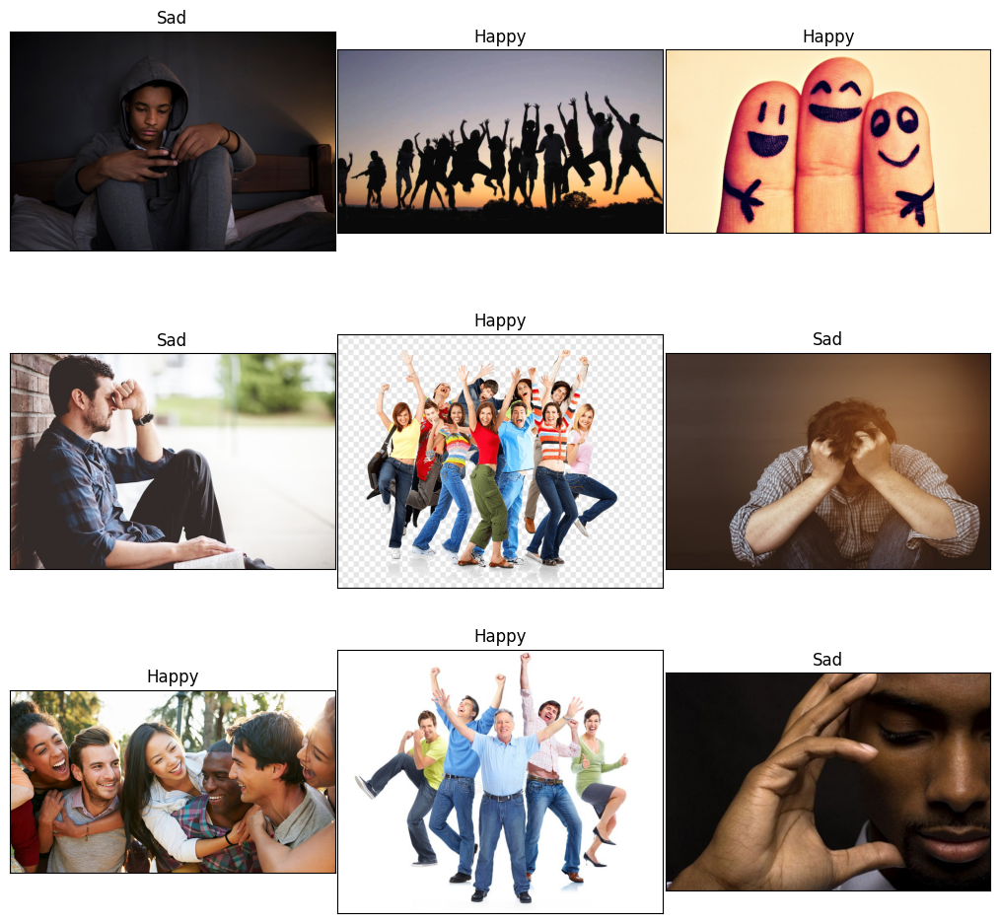

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import random

# Asegúrate de que las variables path y labels estén definidas
path, labels = generate_data_paths(data_dir)

# Crea un DataFrame con las rutas de archivo y etiquetas
df = create_df(path, labels)

# Crea una figura con una cuadrícula de 3x3 para mostrar las imágenes
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # Selecciona una muestra aleatoria del DataFrame
    random_index = random.randint(0, len(df) - 1)
    img_path = df.path[random_index]
    img_label = df.labels[random_index]

    # Carga y muestra la imagen
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.set_title(img_label, fontsize=12)

plt.tight_layout(pad=0.2)
plt.show()


Concluimos con que hemos realizado una correcta clasificación de las imágenes.

**1. CREACIÓN DE UN PRIMER MODELO DE 10 IMÁGENES SOLO DE CADA EMOCIÓN**

Este primer entrenamiento del modelo con pocas imágenes, nos va a servir a modo de prueba para ver su eficiencia, el número de Epoch necesarios para obtener una alta precisión a la hora de clasificar las imágenes y medir una serie de parámetros como F1-score, loU y la Curva ROC.

Importamos las bibliotecas necesarias

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from google.colab.patches import cv2_imshow

Se importa la carpeta de Google Drive que contiene solo las 10 imágenes de cada emoción.

In [ ]:
import os
folder_path = '/content/drive/My Drive/face10'
os.chdir(folder_path)
import os
for dirname, _, filenames in os.walk('/content/drive/My Drive/face10'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/My Drive/face10/Angry/118-1183847_angry-person-png-picture.png
/content/drive/My Drive/face10/Angry/40-bigstock-Mad-fight-of-business-people-61801940.jpg
/content/drive/My Drive/face10/Angry/19_1016_DISCIPLESHIP_How-to-Deal-With-Angry-People_1021x640-696x436.jpg
/content/drive/My Drive/face10/Angry/7-ways-anger-is-ruining-your-health-722x406.jpg
/content/drive/My Drive/face10/Angry/0346f330983a068db0633f96d4a13de873-06-angry.rsquare.w700.jpg
/content/drive/My Drive/face10/Angry/5cd88fd321000035007f6cd2.jpeg
/content/drive/My Drive/face10/Angry/68-688804_angry-person-png-images-angry-man-transparent-png.png
/content/drive/My Drive/face10/Angry/439-4398363_angry-man-png-pictures-angry-person-png-transparent.png
/content/drive/My Drive/face10/Angry/118-1183761_angry-person-transparent-images-png-angry-man-png.png
/content/drive/My Drive/face10/Angry/139-1393790_angry-person-png-pic-angry-man-clipart-png.png
/content/drive/My Drive/face10/Sad/1694806.jpg
/content/drive/My Dr

Usamos KERAS para entrenar y validar modelos de clasificación de imágenes.

In [ ]:
train_img_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_img_datagen = ImageDataGenerator(rescale=1./255)

train_set = train_img_datagen.flow_from_directory(
    '/content/drive/My Drive/face10',
    target_size=(48, 48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

val_set = val_img_datagen.flow_from_directory(
    '/content/drive/My Drive/face10',
    target_size=(48, 48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

Found 30 images belonging to 3 classes.
Found 30 images belonging to 3 classes.


Creamos el modelo. Este modelo de CNN tiene capas convolucionales seguidas de capas de pooling y utiliza técnicas de regularización como Dropout para evitar el sobreajuste. La última capa tiene tres unidades con una función de activación softmax, lo que indica que se trata de un problema de clasificación con tres clases.

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(48, 48, 3), padding='same'))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(3, activation='softmax'))

Este código compila y entrena el modelo de la red neuronal convolucional (CNN) utilizando el conjunto de entrenamiento (train_set) y el conjunto de validación (val_set). El model_info, lo que permite es analizar el rendimiento del modelo a lo largo de las épocas.

Comenzamos probando el entrenamiento con 10 epochs.

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=10, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/10
1/1 [==============================] - 15s 15s/step - loss: 1.1157 - accuracy: 0.2667 - val_loss: 1.0916 - val_accuracy: 0.5000
Epoch 2/10
1/1 [==============================] - 1s 1s/step - loss: 1.0839 - accuracy: 0.4333 - val_loss: 1.0840 - val_accuracy: 0.4000
Epoch 3/10
1/1 [==============================] - 2s 2s/step - loss: 1.0867 - accuracy: 0.3000 - val_loss: 1.0785 - val_accuracy: 0.3667
Epoch 4/10
1/1 [==============================] - 2s 2s/step - loss: 1.0939 - accuracy: 0.3667 - val_loss: 1.0739 - val_accuracy: 0.4000
Epoch 5/10
1/1 [==============================] - 1s 1s/step - loss: 1.0871 - accuracy: 0.3333 - val_loss: 1.0703 - val_accuracy: 0.4000
Epoch 6/10
1/1 [==============================] - 2s 2s/step - loss: 1.0690 - accuracy: 0.3667 - val_loss: 1.0672 - val_accuracy: 0.4000
Epoch 7/10
1/1 [==============================] - 2s 2s/step - loss: 1.0848 - accuracy: 0.2333 - val_loss: 1.0646 - val_accuracy: 0.4333
Epoch 8/10
1/1 [=======================

Utilizamos la biblioteca scikit-learn para calcular el puntaje F1-score del modelo en el conjunto de validación. Un puntaje F1 cercano a 1 indica un buen rendimiento del modelo en la clasificación.

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

1/1 [==============================] - 1s 712ms/step
F1-score: 0.28138528138528135


Hemos observado que el valor del F1-score es muy bajito (0.28) por lo que decidimos volver a entrenar el modelo con 60 epochs.

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=60, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/60
1/1 [==============================] - 6s 6s/step - loss: 1.0695 - accuracy: 0.4667 - val_loss: 1.0487 - val_accuracy: 0.5667
Epoch 2/60
1/1 [==============================] - 2s 2s/step - loss: 1.0440 - accuracy: 0.4667 - val_loss: 1.0450 - val_accuracy: 0.5333
Epoch 3/60
1/1 [==============================] - 1s 1s/step - loss: 1.0466 - accuracy: 0.3667 - val_loss: 1.0413 - val_accuracy: 0.5333
Epoch 4/60
1/1 [==============================] - 1s 1s/step - loss: 1.0116 - accuracy: 0.5000 - val_loss: 1.0363 - val_accuracy: 0.5333
Epoch 5/60
1/1 [==============================] - 2s 2s/step - loss: 1.0128 - accuracy: 0.5667 - val_loss: 1.0303 - val_accuracy: 0.5333
Epoch 6/60
1/1 [==============================] - 2s 2s/step - loss: 1.0425 - accuracy: 0.4667 - val_loss: 1.0234 - val_accuracy: 0.5333
Epoch 7/60
1/1 [==============================] - 2s 2s/step - loss: 0.9874 - accuracy: 0.5333 - val_loss: 1.0163 - val_accuracy: 0.5333
Epoch 8/60
1/1 [=========================

Volvemos a realizar el F1-score a ver si aumenta el valor de eficiencia.

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

1/1 [==============================] - 1s 1s/step
F1-score: 0.2468253968253968


Seguimos con un score bajito, por tanto seguimos entrenando con 120 epochs.

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=120, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/120
1/1 [==============================] - 5s 5s/step - loss: 0.5781 - accuracy: 0.7667 - val_loss: 0.6006 - val_accuracy: 0.7000
Epoch 2/120
1/1 [==============================] - 2s 2s/step - loss: 0.5739 - accuracy: 0.7333 - val_loss: 0.5740 - val_accuracy: 0.7667
Epoch 3/120
1/1 [==============================] - 2s 2s/step - loss: 0.6065 - accuracy: 0.7667 - val_loss: 0.5638 - val_accuracy: 0.8000
Epoch 4/120
1/1 [==============================] - 2s 2s/step - loss: 0.7011 - accuracy: 0.6667 - val_loss: 0.5628 - val_accuracy: 0.7667
Epoch 5/120
1/1 [==============================] - 2s 2s/step - loss: 0.6306 - accuracy: 0.7667 - val_loss: 0.5563 - val_accuracy: 0.7667
Epoch 6/120
1/1 [==============================] - 2s 2s/step - loss: 0.5723 - accuracy: 0.8667 - val_loss: 0.5598 - val_accuracy: 0.7667
Epoch 7/120
1/1 [==============================] - 2s 2s/step - loss: 0.6234 - accuracy: 0.7333 - val_loss: 0.5645 - val_accuracy: 0.7667
Epoch 8/120
1/1 [=================

Se realiza de nuevo el F1-score

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

1/1 [==============================] - 1s 827ms/step
F1-score: 0.43333333333333335


Se observa que el F1-score entra dentro de los parámetros aceptables (0-4-0.6). Pero lo ideal sería que aun aumentasemos el valor entre (0.6 - 0.8)

Utilizamos la biblioteca scikit-learn para calcular la matriz de confusión y luego utiliza la matriz de confusión para calcular el Índice de Intersección sobre Unión (IoU) para cada clase, así como el IoU promedio.

In [ ]:
from sklearn.metrics import confusion_matrix

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Calcular el IoU para cada clase
iou_per_class = np.diag(conf_matrix) / (conf_matrix.sum(axis=1) + conf_matrix.sum(axis=0) - np.diag(conf_matrix))

# Calcular el IoU promedio
mean_iou = np.mean(iou_per_class)
print(f'Intersection over Union (IoU): {mean_iou}')


Intersection over Union (IoU): 0.28104575163398693


Un valor de IoU (Índice de Intersección sobre Unión) de 0.28 indica que la superposición entre las predicciones del modelo y las etiquetas verdaderas es relativamente baja en promedio.

Verificamos las etiquetas en train_set y val_set para ver que se corresponden con las que queremos usar.

Paso 5: Verificar las etiquetas en train_set y val_set

In [ ]:
print("Etiquetas en train_set:")
print(train_set.classes)
print(train_set.class_indices)

print("Etiquetas en val_set:")
print(val_set.classes)
print(val_set.class_indices)

Etiquetas en train_set:
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2]
{'Angry': 0, 'Happy': 1, 'Sad': 2}
Etiquetas en val_set:
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2]
{'Angry': 0, 'Happy': 1, 'Sad': 2}


Paso 6: Guardar y cargar el modelo

In [ ]:
model.save('model.f10')
model = load_model('model.f10')

Se realiza la curva ROC para evaluar el rendimiento del modelo

In [ ]:
# Obtener las probabilidades predichas para el conjunto de validación
y_pred_prob = model.predict(val_set)

# Obtener las etiquetas reales del conjunto de validación
y_true = val_set.classes

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob[:, 1])  # Utiliza las probabilidades de la clase positiva

# Calcular el área bajo la curva ROC (AUC)
roc_auc = auc(fpr, tpr)

# Visualizar la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()

Función para visualizar las predicciones de emociones en forma de gráfico de barras.

Paso 7: Función para visualizar las predicciones de emociones

In [ ]:
def emotion_predict(emotions):
    objects = ('angry', 'sad', 'happy')
    y_pos = np.arange(len(objects))
    plt.bar(y_pos, emotions, align='center', alpha=0.5)
    plt.xticks(y_pos, objects)
    plt.ylabel('percentage')
    plt.title('emotion')
    plt.show()

Paso 8: Función para recortar el rostro de la cara en una imagen y poder centrarnos solo en la expresión de esta. Finalmente no la hemos utilizado.

In [ ]:
def facecrop(image):
    facedata = '/content/drive/My Drive/face_file/haarcascade_frontalface_default.xml'
    cascade = cv2.CascadeClassifier(facedata)
    img = cv2.imread(image)
    try:
        minisize = (img.shape[1], img.shape[0])
        miniframe = cv2.resize(img, minisize)
        faces = cascade.detectMultiScale(miniframe)
        for f in faces:
            x, y, w, h = (v for v in f)
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            sub_face = img[y:y+h, x:x+w]
            cv2.imwrite('capture.jpg', sub_face)
    except Exception as e:
        print(e)

Paso 9: Analizar emociones en imágenes y mostrar resultados

Ahora pasamos a la ejecucción del modelo; cargamos cada imagen y realizamos la predicción de la emoción empleando nuestro modelo anterior y de resultado muestra la imagen junto con la etiqueta de emoción predicha.

1/1 [==============================] - 0s 230ms/step


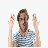

Emoción: angry
1/1 [==============================] - 0s 18ms/step


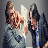

Emoción: angry
1/1 [==============================] - 0s 19ms/step


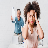

Emoción: angry
1/1 [==============================] - 0s 24ms/step


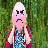

Emoción: angry
1/1 [==============================] - 0s 20ms/step


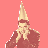

Emoción: angry
1/1 [==============================] - 0s 24ms/step


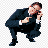

Emoción: angry
1/1 [==============================] - 0s 22ms/step


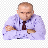

Emoción: angry
1/1 [==============================] - 0s 21ms/step


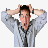

Emoción: angry
1/1 [==============================] - 0s 19ms/step


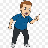

Emoción: angry
1/1 [==============================] - 0s 20ms/step


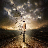

Emoción: sad
1/1 [==============================] - 0s 20ms/step


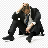

Emoción: sad
1/1 [==============================] - 0s 21ms/step


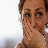

Emoción: sad
1/1 [==============================] - 0s 19ms/step


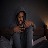

Emoción: sad
1/1 [==============================] - 0s 17ms/step


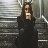

Emoción: sad
1/1 [==============================] - 0s 20ms/step


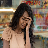

Emoción: sad
1/1 [==============================] - 0s 22ms/step


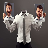

Emoción: sad
1/1 [==============================] - 0s 21ms/step


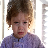

Emoción: sad
1/1 [==============================] - 0s 27ms/step


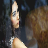

Emoción: sad
1/1 [==============================] - 0s 19ms/step


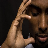

Emoción: sad
1/1 [==============================] - 0s 26ms/step


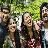

Emoción: happy
1/1 [==============================] - 0s 22ms/step


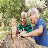

Emoción: happy
1/1 [==============================] - 0s 20ms/step


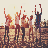

Emoción: happy
1/1 [==============================] - 0s 20ms/step


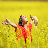

Emoción: happy
1/1 [==============================] - 0s 24ms/step


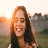

Emoción: happy
1/1 [==============================] - 0s 19ms/step


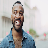

Emoción: happy
1/1 [==============================] - 0s 22ms/step


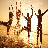

Emoción: happy
1/1 [==============================] - 0s 25ms/step


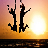

Emoción: happy
1/1 [==============================] - 0s 21ms/step


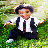

Emoción: happy


In [ ]:
root_directory = '/content/drive/My Drive/face10'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)
    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')

**2. CREACIÓN DE UN MODELO DE 20 IMÁGENES DE CADA EMOCIÓN**

Paso 1: Importar las bibliotecas necesarias

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from google.colab.patches import cv2_imshow

Se importa la carpeta de Google Drive que contiene 10 imágenes de cada emoción

In [ ]:
import os
folder_path = '/content/drive/My Drive/face20'
os.chdir(folder_path)
import os
for dirname, _, filenames in os.walk('/content/drive/My Drive/face20'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/My Drive/face20/Angry/1564075.jpg
/content/drive/My Drive/face20/Angry/439-4398363_angry-man-png-pictures-angry-person-png-transparent.png
/content/drive/My Drive/face20/Angry/40-bigstock-Mad-fight-of-business-people-61801940.jpg
/content/drive/My Drive/face20/Angry/0346f330983a068db0633f96d4a13de873-06-angry.rsquare.w700.jpg
/content/drive/My Drive/face20/Angry/5cd88fd321000035007f6cd2.jpeg
/content/drive/My Drive/face20/Angry/60552212-angry-people-illustration-design-collection.jpg
/content/drive/My Drive/face20/Angry/3710928.jpg
/content/drive/My Drive/face20/Angry/7-ways-anger-is-ruining-your-health-722x406.jpg
/content/drive/My Drive/face20/Angry/118-1183761_angry-person-transparent-images-png-angry-man-png.png
/content/drive/My Drive/face20/Angry/Anger_Controlls_Him.jpg
/content/drive/My Drive/face20/Angry/139-1393790_angry-person-png-pic-angry-man-clipart-png.png
/content/drive/My Drive/face20/Angry/68-688804_angry-person-png-images-angry-man-transparent-png.png
/

Paso 2: Configurar generadores de datos para conjuntos de entrenamiento y validación

In [ ]:
train_img_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_img_datagen = ImageDataGenerator(rescale=1./255)

train_set = train_img_datagen.flow_from_directory(
    '/content/drive/My Drive/face20',
    target_size=(48, 48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

val_set = val_img_datagen.flow_from_directory(
    '/content/drive/My Drive/face20',
    target_size=(48, 48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

Found 59 images belonging to 3 classes.
Found 59 images belonging to 3 classes.


Paso 3: Crear el modelo

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(48, 48, 3), padding='same'))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(3, activation='softmax'))

Paso 4: Compilar y entrenar el modelo

Teniendo como referencia el resultado del modelo anterior, en el que estaba conformado por únicamente 30 imágenes, subimos los Epoch a 150 para evaluar este nuevo modelo.

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=150, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/150
2/2 [==============================] - 11s 3s/step - loss: 1.1127 - accuracy: 0.3390 - val_loss: 1.0879 - val_accuracy: 0.3729
Epoch 2/150
2/2 [==============================] - 3s 2s/step - loss: 1.0770 - accuracy: 0.4068 - val_loss: 1.0848 - val_accuracy: 0.4068
Epoch 3/150
2/2 [==============================] - 3s 2s/step - loss: 1.0659 - accuracy: 0.4576 - val_loss: 1.0835 - val_accuracy: 0.5254
Epoch 4/150
2/2 [==============================] - 2s 2s/step - loss: 1.0917 - accuracy: 0.3390 - val_loss: 1.0817 - val_accuracy: 0.4237
Epoch 5/150
2/2 [==============================] - 2s 2s/step - loss: 1.0897 - accuracy: 0.3559 - val_loss: 1.0788 - val_accuracy: 0.4237
Epoch 6/150
2/2 [==============================] - 4s 3s/step - loss: 1.0640 - accuracy: 0.4746 - val_loss: 1.0755 - val_accuracy: 0.4576
Epoch 7/150
2/2 [==============================] - 3s 3s/step - loss: 1.0693 - accuracy: 0.3729 - val_loss: 1.0715 - val_accuracy: 0.4915
Epoch 8/150
2/2 [================

Se reliza el F1-score para evaluar el rendimiento óptimo en el conjunto de datos de validación

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

2/2 [==============================] - 1s 497ms/step
F1-score: 0.44770450553102603


Se observa que el F1-score entra dentro de los parámetros aceptables (0-4-0.6). Lo ideal sería estar entre 0.8-1.0

Para ello, reentrenamos nuestro modelo, con el más de Epoch con fin de probar si duplicando la cantidad de entrenamiento aumenta el rendimiento óptimo

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=200, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/200
2/2 [==============================] - 7s 4s/step - loss: 0.2917 - accuracy: 0.8814 - val_loss: 0.1384 - val_accuracy: 0.9492
Epoch 2/200
2/2 [==============================] - 3s 2s/step - loss: 0.2938 - accuracy: 0.8814 - val_loss: 0.3083 - val_accuracy: 0.8475
Epoch 3/200
2/2 [==============================] - 3s 2s/step - loss: 0.1972 - accuracy: 0.9153 - val_loss: 0.3437 - val_accuracy: 0.8644
Epoch 4/200
2/2 [==============================] - 2s 2s/step - loss: 0.2041 - accuracy: 0.9153 - val_loss: 0.1958 - val_accuracy: 0.9322
Epoch 5/200
2/2 [==============================] - 2s 2s/step - loss: 0.2060 - accuracy: 0.9153 - val_loss: 0.0981 - val_accuracy: 0.9831
Epoch 6/200
2/2 [==============================] - 4s 3s/step - loss: 0.2992 - accuracy: 0.8814 - val_loss: 0.1047 - val_accuracy: 0.9831
Epoch 7/200
2/2 [==============================] - 3s 2s/step - loss: 0.2051 - accuracy: 0.9831 - val_loss: 0.2016 - val_accuracy: 0.8983
Epoch 8/200
2/2 [=================

Se realiza de nuevo el F1-score

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

2/2 [==============================] - 2s 944ms/step
F1-score: 0.5084745762711864


Se observa que el F1-score entra dentro de los parámetros aceptables (0.4-0.6). Lo ideal estar entre 0.8-1.0 por lo que se repite el entrenamiento.

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=200, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/200
9/9 [==============================] - 16s 2s/step - loss: 2.4370 - accuracy: 0.5682 - val_loss: 1.8675 - val_accuracy: 0.5985
Epoch 2/200
9/9 [==============================] - 13s 1s/step - loss: 1.5489 - accuracy: 0.6174 - val_loss: 1.4438 - val_accuracy: 0.6136
Epoch 3/200
9/9 [==============================] - 11s 1s/step - loss: 1.0654 - accuracy: 0.5909 - val_loss: 0.9230 - val_accuracy: 0.6212
Epoch 4/200
9/9 [==============================] - 23s 3s/step - loss: 0.9588 - accuracy: 0.6098 - val_loss: 0.8550 - val_accuracy: 0.6136
Epoch 5/200
9/9 [==============================] - 16s 2s/step - loss: 0.8693 - accuracy: 0.6136 - val_loss: 0.8829 - val_accuracy: 0.6326
Epoch 6/200
9/9 [==============================] - 13s 2s/step - loss: 0.8603 - accuracy: 0.6174 - val_loss: 0.8105 - val_accuracy: 0.6477
Epoch 7/200
9/9 [==============================] - 14s 2s/step - loss: 0.8157 - accuracy: 0.6477 - val_loss: 0.7845 - val_accuracy: 0.6477
Epoch 8/200
9/9 [==========

Se realiza de nuevo el F1-score

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

9/9 [==============================] - 8s 967ms/step
F1-score: 0.3560606060606061


Se observa que el F1-score no entra dentro de los parámetros aceptables (0.35). Lo ideal estar entre 0.8-1.0 por lo que se repite el entrenamiento.

Se realiza el loU para medir la superposición entre la predicción y la verdad

In [ ]:
from sklearn.metrics import confusion_matrix

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Calcular el IoU para cada clase
iou_per_class = np.diag(conf_matrix) / (conf_matrix.sum(axis=1) + conf_matrix.sum(axis=0) - np.diag(conf_matrix))

# Calcular el IoU promedio
mean_iou = np.mean(iou_per_class)
print(f'Intersection over Union (IoU): {mean_iou}')


Intersection over Union (IoU): 0.3430796122675989


Esto significa que aproximadamente el 34.30% de la región predicha se superpone con la región verdadera

Paso 5: Verificar las etiquetas en train_set y val_set

In [ ]:
print("Etiquetas en train_set:")
print(train_set.classes)
print(train_set.class_indices)

print("Etiquetas en val_set:")
print(val_set.classes)
print(val_set.class_indices)

Etiquetas en train_set:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
{'Angry': 0, 'Happy': 1, 'Sad': 2}
Etiquetas en val_set:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
{'Angry': 0, 'Happy': 1, 'Sad': 2}


Paso 6: Guardar y cargar el modelo

In [ ]:
model.save('model.f20')
model = load_model('model.f20')

Se realiza la curva ROC para evaluar el rendimiento del modelo. No se llega a conseguir imprimir por lo que se recurre a otras métricas como el F1 score y la matriz de confusión (más adelante).

In [ ]:
# Obtener las probabilidades predichas para el conjunto de validación
y_pred_prob = model.predict(val_set)

# Obtener las etiquetas reales del conjunto de validación
y_true = val_set.classes

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob[:, 1])  # Utiliza las probabilidades de la clase positiva

# Calcular el área bajo la curva ROC (AUC)
roc_auc = auc(fpr, tpr)

# Visualizar la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()

Paso 7: Función para visualizar las predicciones de emociones

In [ ]:
def emotion_predict(emotions):
    objects = ('angry', 'sad', 'happy')
    y_pos = np.arange(len(objects))
    plt.bar(y_pos, emotions, align='center', alpha=0.5)
    plt.xticks(y_pos, objects)
    plt.ylabel('percentage')
    plt.title('emotion')
    plt.show()

Paso 8: Función para recortar el rostro en una imagen

In [ ]:
def facecrop(image):
    facedata = '/content/drive/My Drive/face_file/haarcascade_frontalface_default.xml'
    cascade = cv2.CascadeClassifier(facedata)
    img = cv2.imread(image)
    try:
        minisize = (img.shape[1], img.shape[0])
        miniframe = cv2.resize(img, minisize)
        faces = cascade.detectMultiScale(miniframe)
        for f in faces:
            x, y, w, h = (v for v in f)
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            sub_face = img[y:y+h, x:x+w]
            cv2.imwrite('capture.jpg', sub_face)
    except Exception as e:
        print(e)

Paso 9: Analizar emociones en imágenes y mostrar resultados

1/1 [==============================] - 0s 98ms/step


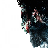

Emoción: angry
1/1 [==============================] - 0s 21ms/step


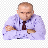

Emoción: angry
1/1 [==============================] - 0s 19ms/step


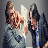

Emoción: happy
1/1 [==============================] - 0s 22ms/step


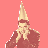

Emoción: happy
1/1 [==============================] - 0s 20ms/step


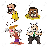

Emoción: angry
1/1 [==============================] - 0s 20ms/step


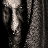

Emoción: angry
1/1 [==============================] - 0s 19ms/step


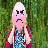

Emoción: angry
1/1 [==============================] - 0s 18ms/step


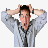

Emoción: angry
1/1 [==============================] - 0s 18ms/step


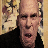

Emoción: angry
1/1 [==============================] - 0s 19ms/step


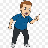

Emoción: angry
1/1 [==============================] - 0s 20ms/step


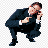

Emoción: angry
1/1 [==============================] - 0s 20ms/step


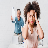

Emoción: angry
1/1 [==============================] - 0s 21ms/step


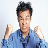

Emoción: sad
1/1 [==============================] - 0s 25ms/step


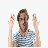

Emoción: angry
1/1 [==============================] - 0s 19ms/step


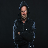

Emoción: angry
1/1 [==============================] - 0s 22ms/step


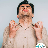

Emoción: angry
1/1 [==============================] - 0s 20ms/step


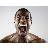

Emoción: angry
1/1 [==============================] - 0s 18ms/step


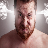

Emoción: angry
1/1 [==============================] - 0s 18ms/step


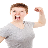

Emoción: angry
1/1 [==============================] - 0s 18ms/step


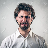

Emoción: sad
1/1 [==============================] - 0s 18ms/step


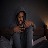

Emoción: sad
1/1 [==============================] - 0s 19ms/step


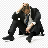

Emoción: sad
1/1 [==============================] - 0s 20ms/step


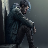

Emoción: sad
1/1 [==============================] - 0s 19ms/step


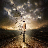

Emoción: angry
1/1 [==============================] - 0s 19ms/step


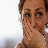

Emoción: sad
1/1 [==============================] - 0s 17ms/step


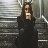

Emoción: sad
1/1 [==============================] - 0s 17ms/step


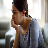

Emoción: sad
1/1 [==============================] - 0s 20ms/step


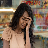

Emoción: angry
1/1 [==============================] - 0s 19ms/step


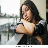

Emoción: sad
1/1 [==============================] - 0s 18ms/step


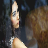

Emoción: sad
1/1 [==============================] - 0s 21ms/step


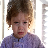

Emoción: sad
1/1 [==============================] - 0s 22ms/step


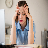

Emoción: sad
1/1 [==============================] - 0s 19ms/step


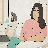

Emoción: happy
1/1 [==============================] - 0s 20ms/step


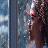

Emoción: angry
1/1 [==============================] - 0s 21ms/step


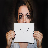

Emoción: sad
1/1 [==============================] - 0s 19ms/step


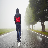

Emoción: sad
1/1 [==============================] - 0s 18ms/step


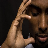

Emoción: angry
1/1 [==============================] - 0s 23ms/step


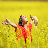

Emoción: happy
1/1 [==============================] - 0s 19ms/step


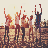

Emoción: happy
1/1 [==============================] - 0s 17ms/step


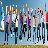

Emoción: happy
1/1 [==============================] - 0s 17ms/step


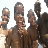

Emoción: happy
1/1 [==============================] - 0s 20ms/step


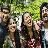

Emoción: happy
1/1 [==============================] - 0s 17ms/step


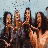

Emoción: happy
1/1 [==============================] - 0s 18ms/step


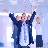

Emoción: happy
1/1 [==============================] - 0s 20ms/step


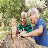

Emoción: happy
1/1 [==============================] - 0s 32ms/step


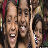

Emoción: happy
1/1 [==============================] - 0s 19ms/step


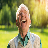

Emoción: happy
1/1 [==============================] - 0s 19ms/step


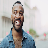

Emoción: happy
1/1 [==============================] - 0s 19ms/step


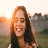

Emoción: happy
1/1 [==============================] - 0s 18ms/step


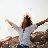

Emoción: happy
1/1 [==============================] - 0s 25ms/step


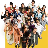

Emoción: happy
1/1 [==============================] - 0s 24ms/step


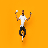

Emoción: happy
1/1 [==============================] - 0s 17ms/step


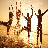

Emoción: happy
1/1 [==============================] - 0s 21ms/step


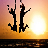

Emoción: happy
1/1 [==============================] - 0s 18ms/step


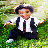

Emoción: happy


In [ ]:
root_directory = '/content/drive/My Drive/face20'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)
    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')


**3. CREACIÓN DE UN MODELO CON TODAS LAS IMÁGENES DE CADA EMOCIÓN**

Finalmente, se concluye con el modelo definitivo que integra todas las imágenes con fin de identificar sus emociones.

Paso 1: Importar las bibliotecas necesarias

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from google.colab.patches import cv2_imshow

Se importa la carpeta de Google Drive que contiene 10 imágenes de cada emoción

In [ ]:
import os
folder_path = '/content/drive/My Drive/faceTODAS'
os.chdir(folder_path)
import os
for dirname, _, filenames in os.walk('/content/drive/My Drive/faceTODAS'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/My Drive/faceTODAS/Angry/439-4398363_angry-man-png-pictures-angry-person-png-transparent.png
/content/drive/My Drive/faceTODAS/Angry/60552212-angry-people-illustration-design-collection.jpg
/content/drive/My Drive/faceTODAS/Angry/40-bigstock-Mad-fight-of-business-people-61801940.jpg
/content/drive/My Drive/faceTODAS/Angry/118-1183761_angry-person-transparent-images-png-angry-man-png.png
/content/drive/My Drive/faceTODAS/Angry/Anger_Controlls_Him.jpg
/content/drive/My Drive/faceTODAS/Angry/Angry-Customer.jpg
/content/drive/My Drive/faceTODAS/Angry/19_1016_DISCIPLESHIP_How-to-Deal-With-Angry-People_1021x640-696x436.jpg
/content/drive/My Drive/faceTODAS/Angry/32209658.jpg
/content/drive/My Drive/faceTODAS/Angry/0346f330983a068db0633f96d4a13de873-06-angry.rsquare.w700.jpg
/content/drive/My Drive/faceTODAS/Angry/68-688804_angry-person-png-images-angry-man-transparent-png.png
/content/drive/My Drive/faceTODAS/Angry/139-1393790_angry-person-png-pic-angry-man-clipart-png.png
/co

Paso 2: Configurar generadores de datos para conjuntos de entrenamiento y validación

In [ ]:
train_img_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_img_datagen = ImageDataGenerator(rescale=1./255)

train_set = train_img_datagen.flow_from_directory(
    '/content/drive/My Drive/faceTODAS',
    target_size=(48, 48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

val_set = val_img_datagen.flow_from_directory(
    '/content/drive/My Drive/faceTODAS',
    target_size=(48, 48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

Found 264 images belonging to 3 classes.
Found 264 images belonging to 3 classes.


Paso 3: Crear el modelo

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(48, 48, 3), padding='same'))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(3, activation='softmax'))

Paso 4: Compilar y entrenar el modelo

Teniendo como referencia los resultados dos modelos anteriores, que estaban conformado por 30 y 60 imágenes respectivamente, subimos los Epoch a 500 para evaluar este nuevo modelo. Con ello esperamos tener un alto F1-score.

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Reentrenar el modelo con más épocas
model_info = model.fit(train_set, steps_per_epoch=len(train_set), epochs=500, validation_data=val_set, validation_steps=len(val_set))

Epoch 1/500
9/9 [==============================] - 44s 5s/step - loss: 1.0962 - accuracy: 0.3371 - val_loss: 1.0781 - val_accuracy: 0.3788
Epoch 2/500
9/9 [==============================] - 16s 2s/step - loss: 1.0883 - accuracy: 0.3864 - val_loss: 1.0749 - val_accuracy: 0.3788
Epoch 3/500
9/9 [==============================] - 16s 2s/step - loss: 1.1010 - accuracy: 0.3674 - val_loss: 1.0781 - val_accuracy: 0.3902
Epoch 4/500
9/9 [==============================] - 16s 2s/step - loss: 1.0826 - accuracy: 0.3977 - val_loss: 1.0677 - val_accuracy: 0.3977
Epoch 5/500
9/9 [==============================] - 12s 2s/step - loss: 1.0718 - accuracy: 0.4053 - val_loss: 1.0624 - val_accuracy: 0.4432
Epoch 6/500
9/9 [==============================] - 11s 1s/step - loss: 1.0761 - accuracy: 0.3636 - val_loss: 1.0620 - val_accuracy: 0.4735
Epoch 7/500
9/9 [==============================] - 12s 1s/step - loss: 1.0547 - accuracy: 0.4356 - val_loss: 1.0426 - val_accuracy: 0.4621
Epoch 8/500
9/9 [==========

Se reliza el F1-score para evaluar el rendimiento óptimo en el conjunto de datos de validación

In [ ]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

9/9 [==============================] - 7s 686ms/step
F1-score: 0.3409090909090909


Observamos que nos sigue saliendo un F1-score muy bajo, creemos que igual algo estamos haciendo mal en el código, por que aumentamos las imágenes en el entrenamiento y los epochs pero el rendimiento sigue sin mejorar, pero no conseguimos encontrar el fallo.

Se realiza el loU para medir la superposición entre la predicción y la verdad

In [ ]:
from sklearn.metrics import confusion_matrix

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Calcular el IoU para cada clase
iou_per_class = np.diag(conf_matrix) / (conf_matrix.sum(axis=1) + conf_matrix.sum(axis=0) - np.diag(conf_matrix))

# Calcular el IoU promedio
mean_iou = np.mean(iou_per_class)
print(f'Intersection over Union (IoU): {mean_iou}')


Intersection over Union (IoU): 0.2038697498820198


Esto significa que aproximadamente el 20.38% de la región predicha se superpone con la región verdadera

Paso 5: Verificar las etiquetas en train_set y val_set

In [ ]:
print("Etiquetas en train_set:")
print(train_set.classes)
print(train_set.class_indices)

print("Etiquetas en val_set:")
print(val_set.classes)
print(val_set.class_indices)

Etiquetas en train_set:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2]
{'Angry': 0, 'Happy': 1, 'Sad': 2}
Etiquetas en val_set:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 2 

Paso 6: Guardar y cargar el modelo

In [ ]:
model.save('model.fTODAS')
model = load_model('model.fTODAS')

Se realiza la curva ROC para evaluar el rendimiento del modelo

In [ ]:
# Obtener las probabilidades predichas para el conjunto de validación
y_pred_prob = model.predict(val_set)

# Obtener las etiquetas reales del conjunto de validación
y_true = val_set.classes

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob[:, 1])  # Utiliza las probabilidades de la clase positiva

# Calcular el área bajo la curva ROC (AUC)
roc_auc = auc(fpr, tpr)

# Visualizar la curva ROC
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()

Paso 7: Función para visualizar las predicciones de emociones

In [ ]:
def emotion_predict(emotions):
    objects = ('angry', 'sad', 'happy')
    y_pos = np.arange(len(objects))
    plt.bar(y_pos, emotions, align='center', alpha=0.5)
    plt.xticks(y_pos, objects)
    plt.ylabel('percentage')
    plt.title('emotion')
    plt.show()

Paso 8: Función para recortar el rostro en una imagen

In [ ]:
def facecrop(image):
    facedata = '/content/drive/My Drive/face_file/haarcascade_frontalface_default.xml'
    cascade = cv2.CascadeClassifier(facedata)
    img = cv2.imread(image)
    try:
        minisize = (img.shape[1], img.shape[0])
        miniframe = cv2.resize(img, minisize)
        faces = cascade.detectMultiScale(miniframe)
        for f in faces:
            x, y, w, h = (v for v in f)
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            sub_face = img[y:y+h, x:x+w]
            cv2.imwrite('capture.jpg', sub_face)
    except Exception as e:
        print(e)

Paso 9: Analizar emociones en imágenes y mostrar resultados

1/1 [==============================] - 0s 91ms/step


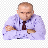

Emoción: happy
1/1 [==============================] - 0s 18ms/step


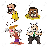

Emoción: angry
1/1 [==============================] - 0s 18ms/step


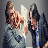

Emoción: sad
1/1 [==============================] - 0s 24ms/step


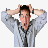

Emoción: angry
1/1 [==============================] - 0s 24ms/step


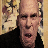

Emoción: sad
1/1 [==============================] - 0s 19ms/step


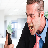

Emoción: angry
1/1 [==============================] - 0s 22ms/step


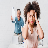

Emoción: sad
1/1 [==============================] - 0s 18ms/step


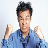

Emoción: sad
1/1 [==============================] - 0s 18ms/step


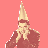

Emoción: sad
1/1 [==============================] - 0s 19ms/step


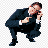

Emoción: angry
1/1 [==============================] - 0s 21ms/step


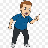

Emoción: angry
1/1 [==============================] - 0s 20ms/step


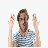

Emoción: angry
1/1 [==============================] - 0s 18ms/step


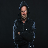

Emoción: sad
1/1 [==============================] - 0s 20ms/step


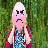

Emoción: happy
1/1 [==============================] - 0s 19ms/step


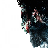

Emoción: angry
1/1 [==============================] - 0s 18ms/step


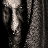

Emoción: angry
1/1 [==============================] - 0s 18ms/step


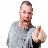

Emoción: sad
1/1 [==============================] - 0s 21ms/step


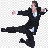

Emoción: angry
1/1 [==============================] - 0s 25ms/step


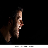

Emoción: angry
1/1 [==============================] - 0s 26ms/step


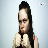

Emoción: sad
1/1 [==============================] - 0s 21ms/step


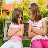

Emoción: happy
1/1 [==============================] - 0s 21ms/step


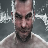

Emoción: happy
1/1 [==============================] - 0s 23ms/step


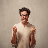

Emoción: sad
1/1 [==============================] - 0s 18ms/step


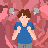

Emoción: happy
1/1 [==============================] - 0s 19ms/step


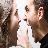

Emoción: angry
1/1 [==============================] - 0s 19ms/step


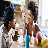

Emoción: angry
1/1 [==============================] - 0s 21ms/step


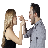

Emoción: angry
1/1 [==============================] - 0s 21ms/step


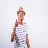

Emoción: angry
1/1 [==============================] - 0s 20ms/step


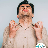

Emoción: sad
1/1 [==============================] - 0s 19ms/step


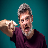

Emoción: happy
1/1 [==============================] - 0s 18ms/step


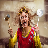

Emoción: happy
1/1 [==============================] - 0s 22ms/step


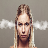

Emoción: sad
1/1 [==============================] - 0s 20ms/step


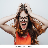

Emoción: happy
1/1 [==============================] - 0s 20ms/step


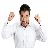

Emoción: sad
1/1 [==============================] - 0s 24ms/step


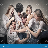

Emoción: happy
1/1 [==============================] - 0s 23ms/step


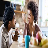

Emoción: sad
1/1 [==============================] - 0s 19ms/step


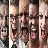

Emoción: angry
1/1 [==============================] - 0s 19ms/step


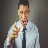

Emoción: angry
1/1 [==============================] - 0s 17ms/step


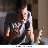

Emoción: angry
1/1 [==============================] - 0s 19ms/step


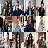

Emoción: angry
1/1 [==============================] - 0s 32ms/step


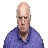

Emoción: happy
1/1 [==============================] - 0s 37ms/step


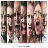

Emoción: angry
1/1 [==============================] - 0s 36ms/step


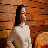

Emoción: sad
1/1 [==============================] - 0s 34ms/step


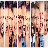

Emoción: angry
1/1 [==============================] - 0s 32ms/step


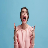

Emoción: sad
1/1 [==============================] - 0s 38ms/step


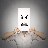

Emoción: angry
1/1 [==============================] - 0s 31ms/step


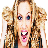

Emoción: happy
1/1 [==============================] - 0s 26ms/step


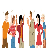

Emoción: happy
1/1 [==============================] - 0s 27ms/step


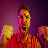

Emoción: happy
1/1 [==============================] - 0s 30ms/step


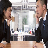

Emoción: angry
1/1 [==============================] - 0s 38ms/step


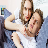

Emoción: sad
1/1 [==============================] - 0s 38ms/step


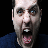

Emoción: sad
1/1 [==============================] - 0s 34ms/step


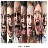

Emoción: angry
1/1 [==============================] - 0s 27ms/step


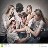

Emoción: angry
1/1 [==============================] - 0s 30ms/step


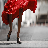

Emoción: angry
1/1 [==============================] - 0s 42ms/step


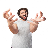

Emoción: angry
1/1 [==============================] - 0s 31ms/step


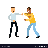

Emoción: angry
1/1 [==============================] - 0s 28ms/step


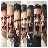

Emoción: angry
1/1 [==============================] - 0s 51ms/step


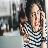

Emoción: angry
1/1 [==============================] - 0s 39ms/step


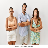

Emoción: happy
1/1 [==============================] - 0s 34ms/step


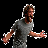

Emoción: angry
1/1 [==============================] - 0s 29ms/step


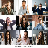

Emoción: angry
1/1 [==============================] - 0s 28ms/step


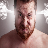

Emoción: sad
1/1 [==============================] - 0s 26ms/step


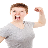

Emoción: sad
1/1 [==============================] - 0s 27ms/step


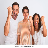

Emoción: happy
1/1 [==============================] - 0s 25ms/step


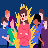

Emoción: angry
1/1 [==============================] - 0s 27ms/step


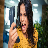

Emoción: sad
1/1 [==============================] - 0s 34ms/step


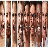

Emoción: angry
1/1 [==============================] - 0s 41ms/step


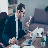

Emoción: angry
1/1 [==============================] - 0s 27ms/step


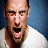

Emoción: angry
1/1 [==============================] - 0s 27ms/step


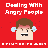

Emoción: sad
1/1 [==============================] - 0s 27ms/step


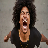

Emoción: sad
1/1 [==============================] - 0s 29ms/step


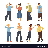

Emoción: angry
1/1 [==============================] - 0s 31ms/step


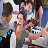

Emoción: angry
1/1 [==============================] - 0s 33ms/step


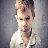

Emoción: sad
1/1 [==============================] - 0s 27ms/step


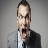

Emoción: sad
1/1 [==============================] - 0s 27ms/step


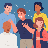

Emoción: happy
1/1 [==============================] - 0s 33ms/step


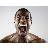

Emoción: angry
1/1 [==============================] - 0s 34ms/step


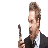

Emoción: angry
1/1 [==============================] - 0s 32ms/step


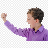

Emoción: angry
1/1 [==============================] - 0s 31ms/step


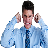

Emoción: sad
1/1 [==============================] - 0s 27ms/step


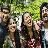

Emoción: happy
1/1 [==============================] - 0s 33ms/step


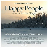

Emoción: sad
1/1 [==============================] - 0s 31ms/step


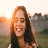

Emoción: sad
1/1 [==============================] - 0s 31ms/step


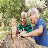

Emoción: happy
1/1 [==============================] - 0s 40ms/step


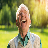

Emoción: happy
1/1 [==============================] - 0s 30ms/step


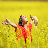

Emoción: happy
1/1 [==============================] - 0s 27ms/step


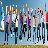

Emoción: happy
1/1 [==============================] - 0s 47ms/step


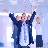

Emoción: happy
1/1 [==============================] - 0s 32ms/step


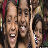

Emoción: happy
1/1 [==============================] - 0s 28ms/step


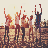

Emoción: happy
1/1 [==============================] - 0s 26ms/step


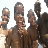

Emoción: happy
1/1 [==============================] - 0s 18ms/step


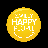

Emoción: sad
1/1 [==============================] - 0s 17ms/step


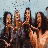

Emoción: happy
1/1 [==============================] - 0s 19ms/step


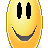

Emoción: angry
1/1 [==============================] - 0s 18ms/step


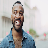

Emoción: happy
1/1 [==============================] - 0s 20ms/step


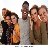

Emoción: angry
1/1 [==============================] - 0s 19ms/step


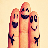

Emoción: angry
1/1 [==============================] - 0s 22ms/step


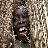

Emoción: happy
1/1 [==============================] - 0s 19ms/step


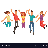

Emoción: happy
1/1 [==============================] - 0s 18ms/step


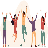

Emoción: happy
1/1 [==============================] - 0s 20ms/step


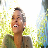

Emoción: happy
1/1 [==============================] - 0s 17ms/step


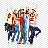

Emoción: happy
1/1 [==============================] - 0s 23ms/step


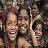

Emoción: happy
1/1 [==============================] - 0s 18ms/step


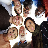

Emoción: happy
1/1 [==============================] - 0s 23ms/step


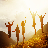

Emoción: happy
1/1 [==============================] - 0s 22ms/step


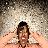

Emoción: happy
1/1 [==============================] - 0s 25ms/step


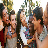

Emoción: happy
1/1 [==============================] - 0s 25ms/step


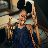

Emoción: happy
1/1 [==============================] - 0s 19ms/step


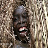

Emoción: happy
1/1 [==============================] - 0s 17ms/step


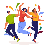

Emoción: happy
1/1 [==============================] - 0s 20ms/step


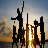

Emoción: sad
1/1 [==============================] - 0s 18ms/step


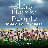

Emoción: happy
1/1 [==============================] - 0s 18ms/step


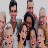

Emoción: sad
1/1 [==============================] - 0s 20ms/step


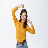

Emoción: happy
1/1 [==============================] - 0s 18ms/step


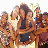

Emoción: sad
1/1 [==============================] - 0s 19ms/step


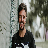

Emoción: happy
1/1 [==============================] - 0s 24ms/step


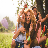

Emoción: happy
1/1 [==============================] - 0s 22ms/step


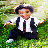

Emoción: happy
1/1 [==============================] - 0s 18ms/step


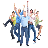

Emoción: happy
1/1 [==============================] - 0s 18ms/step


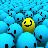

Emoción: happy
1/1 [==============================] - 0s 27ms/step


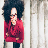

Emoción: angry
1/1 [==============================] - 0s 20ms/step


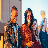

Emoción: happy
1/1 [==============================] - 0s 19ms/step


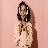

Emoción: sad
1/1 [==============================] - 0s 24ms/step


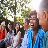

Emoción: happy
1/1 [==============================] - 0s 19ms/step


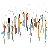

Emoción: happy
1/1 [==============================] - 0s 23ms/step


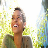

Emoción: happy
1/1 [==============================] - 0s 18ms/step


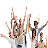

Emoción: happy
1/1 [==============================] - 0s 24ms/step


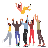

Emoción: happy
1/1 [==============================] - 0s 18ms/step


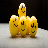

Emoción: happy
1/1 [==============================] - 0s 21ms/step


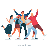

Emoción: happy
1/1 [==============================] - 0s 18ms/step


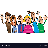

Emoción: happy
1/1 [==============================] - 0s 23ms/step


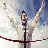

Emoción: happy
1/1 [==============================] - 0s 20ms/step


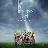

Emoción: sad
1/1 [==============================] - 0s 18ms/step


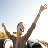

Emoción: happy
1/1 [==============================] - 0s 17ms/step


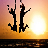

Emoción: sad
1/1 [==============================] - 0s 21ms/step


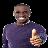

Emoción: happy
1/1 [==============================] - 0s 25ms/step


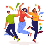

Emoción: happy
1/1 [==============================] - 0s 18ms/step


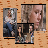

Emoción: sad
1/1 [==============================] - 0s 23ms/step


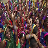

Emoción: happy
1/1 [==============================] - 0s 18ms/step


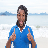

Emoción: happy
1/1 [==============================] - 0s 18ms/step


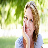

Emoción: happy
1/1 [==============================] - 0s 19ms/step


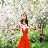

Emoción: happy
1/1 [==============================] - 0s 32ms/step


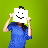

Emoción: happy
1/1 [==============================] - 0s 19ms/step


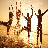

Emoción: happy
1/1 [==============================] - 0s 19ms/step


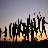

Emoción: happy
1/1 [==============================] - 0s 18ms/step


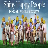

Emoción: happy
1/1 [==============================] - 0s 19ms/step


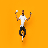

Emoción: happy
1/1 [==============================] - 0s 19ms/step


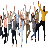

Emoción: happy
1/1 [==============================] - 0s 21ms/step


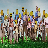

Emoción: happy
1/1 [==============================] - 0s 21ms/step


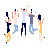

Emoción: happy
1/1 [==============================] - 0s 22ms/step


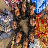

Emoción: happy
1/1 [==============================] - 0s 18ms/step


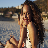

Emoción: sad
1/1 [==============================] - 0s 27ms/step


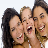

Emoción: sad
1/1 [==============================] - 0s 19ms/step


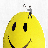

Emoción: happy
1/1 [==============================] - 0s 20ms/step


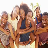

Emoción: sad
1/1 [==============================] - 0s 18ms/step


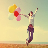

Emoción: happy
1/1 [==============================] - 0s 18ms/step


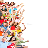

Emoción: happy
1/1 [==============================] - 0s 19ms/step


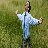

Emoción: happy
1/1 [==============================] - 0s 19ms/step


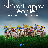

Emoción: happy
1/1 [==============================] - 0s 22ms/step


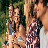

Emoción: happy
1/1 [==============================] - 0s 19ms/step


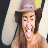

Emoción: happy
1/1 [==============================] - 0s 19ms/step


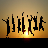

Emoción: happy
1/1 [==============================] - 0s 21ms/step


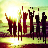

Emoción: happy
1/1 [==============================] - 0s 27ms/step


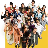

Emoción: happy
1/1 [==============================] - 0s 22ms/step


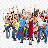

Emoción: happy
1/1 [==============================] - 0s 21ms/step


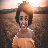

Emoción: sad
1/1 [==============================] - 0s 18ms/step


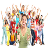

Emoción: happy
1/1 [==============================] - 0s 20ms/step


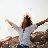

Emoción: happy
1/1 [==============================] - 0s 22ms/step


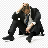

Emoción: sad
1/1 [==============================] - 0s 20ms/step


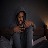

Emoción: sad
1/1 [==============================] - 0s 22ms/step


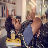

Emoción: sad
1/1 [==============================] - 0s 20ms/step


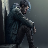

Emoción: sad
1/1 [==============================] - 0s 22ms/step


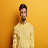

Emoción: happy
1/1 [==============================] - 0s 18ms/step


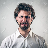

Emoción: sad
1/1 [==============================] - 0s 19ms/step


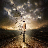

Emoción: sad
1/1 [==============================] - 0s 21ms/step


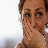

Emoción: sad
1/1 [==============================] - 0s 32ms/step


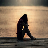

Emoción: sad
1/1 [==============================] - 0s 18ms/step


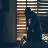

Emoción: sad
1/1 [==============================] - 0s 18ms/step


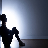

Emoción: sad
1/1 [==============================] - 0s 25ms/step


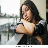

Emoción: sad
1/1 [==============================] - 0s 25ms/step


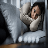

Emoción: sad
1/1 [==============================] - 0s 18ms/step


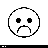

Emoción: sad
1/1 [==============================] - 0s 22ms/step


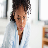

Emoción: sad
1/1 [==============================] - 0s 18ms/step


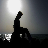

Emoción: sad
1/1 [==============================] - 0s 35ms/step


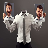

Emoción: sad
1/1 [==============================] - 0s 18ms/step


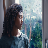

Emoción: sad
1/1 [==============================] - 0s 29ms/step


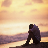

Emoción: sad
1/1 [==============================] - 0s 35ms/step


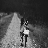

Emoción: sad
1/1 [==============================] - 0s 42ms/step


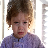

Emoción: sad
1/1 [==============================] - 0s 38ms/step


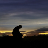

Emoción: sad
1/1 [==============================] - 0s 33ms/step


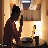

Emoción: sad
1/1 [==============================] - 0s 33ms/step


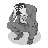

Emoción: sad
1/1 [==============================] - 0s 52ms/step


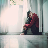

Emoción: sad
1/1 [==============================] - 0s 41ms/step


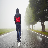

Emoción: sad
1/1 [==============================] - 0s 41ms/step


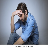

Emoción: sad
1/1 [==============================] - 0s 45ms/step


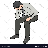

Emoción: sad
1/1 [==============================] - 0s 30ms/step


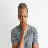

Emoción: sad
1/1 [==============================] - 0s 41ms/step


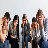

Emoción: sad
1/1 [==============================] - 0s 61ms/step


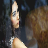

Emoción: sad
1/1 [==============================] - 0s 56ms/step


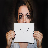

Emoción: sad
1/1 [==============================] - 0s 40ms/step


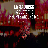

Emoción: sad
1/1 [==============================] - 0s 39ms/step


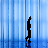

Emoción: sad
1/1 [==============================] - 0s 26ms/step


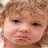

Emoción: sad
1/1 [==============================] - 0s 56ms/step


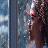

Emoción: sad
1/1 [==============================] - 0s 26ms/step


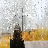

Emoción: sad
1/1 [==============================] - 0s 44ms/step


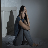

Emoción: sad
1/1 [==============================] - 0s 69ms/step


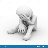

Emoción: sad
1/1 [==============================] - 0s 29ms/step


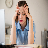

Emoción: sad
1/1 [==============================] - 0s 29ms/step


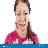

Emoción: sad
1/1 [==============================] - 0s 26ms/step


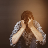

Emoción: sad
1/1 [==============================] - 0s 35ms/step


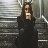

Emoción: sad
1/1 [==============================] - 0s 26ms/step


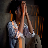

Emoción: sad
1/1 [==============================] - 0s 31ms/step


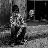

Emoción: sad
1/1 [==============================] - 0s 59ms/step


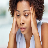

Emoción: sad
1/1 [==============================] - 0s 52ms/step


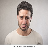

Emoción: sad
1/1 [==============================] - 0s 42ms/step


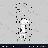

Emoción: sad
1/1 [==============================] - 0s 45ms/step


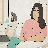

Emoción: sad
1/1 [==============================] - 0s 26ms/step


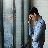

Emoción: sad
1/1 [==============================] - 0s 43ms/step


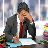

Emoción: sad
1/1 [==============================] - 0s 39ms/step


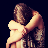

Emoción: sad
1/1 [==============================] - 0s 28ms/step


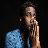

Emoción: sad
1/1 [==============================] - 0s 26ms/step


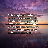

Emoción: sad
1/1 [==============================] - 0s 27ms/step


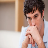

Emoción: sad
1/1 [==============================] - 0s 26ms/step


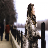

Emoción: sad
1/1 [==============================] - 0s 25ms/step


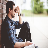

Emoción: sad
1/1 [==============================] - 0s 25ms/step


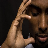

Emoción: sad
1/1 [==============================] - 0s 58ms/step


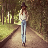

Emoción: happy
1/1 [==============================] - 0s 29ms/step


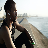

Emoción: sad
1/1 [==============================] - 0s 30ms/step


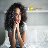

Emoción: sad
1/1 [==============================] - 0s 47ms/step


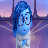

Emoción: happy
1/1 [==============================] - 0s 34ms/step


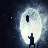

Emoción: sad
1/1 [==============================] - 0s 31ms/step


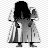

Emoción: sad
1/1 [==============================] - 0s 27ms/step


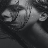

Emoción: sad
1/1 [==============================] - 0s 62ms/step


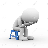

Emoción: sad
1/1 [==============================] - 0s 37ms/step


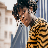

Emoción: sad
1/1 [==============================] - 0s 66ms/step


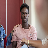

Emoción: sad
1/1 [==============================] - 0s 37ms/step


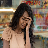

Emoción: sad
1/1 [==============================] - 0s 26ms/step


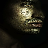

Emoción: sad
1/1 [==============================] - 0s 27ms/step


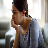

Emoción: sad
1/1 [==============================] - 0s 27ms/step


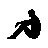

Emoción: sad
1/1 [==============================] - 0s 45ms/step


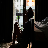

Emoción: sad


In [ ]:
root_directory = '/content/drive/My Drive/faceTODAS'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)
    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')


**ANEXO: CON IMÁGENES NUEVAS NUESTRAS OBSERVANDO LA DETECCIÓN DE LAS EMOCIONES**

**Idea añadida**: hemos decidido poner unas imágenes de cosecha propia para ver si identifica nuestras emociones.

Viendo los resultados de todos los modelos creados, vemos el más eficiente en base al F1-score el Modelo de TODAS las imágenes. Dicho modelo es el elegido para identificar las emociones de las siguientes imágenes.

Paso 1: Importar las bibliotecas necesarias

In [ ]:
from google.colab import files
import cv2
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt

Paso 2: Cargar el modelo previamente entrenado

In [ ]:
model = load_model('/content/drive/My Drive/faceTODAS/model.fTODAS')

Paso 3: Definir las etiquetas de emociones

In [ ]:
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

Paso 4: Cargar una imagen en Colab, procesarla e imprimirla.

In [ ]:
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

1/1 [==============================] - 0s 97ms/step
Emoción: sad


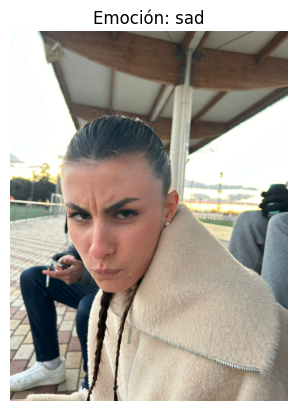

In [ ]:
# Paso 2: Preprocesar la imagen
img = cv2.imread(image_path)
img = cv2.resize(img, (48, 48))
img = np.expand_dims(img, axis=0) / 255.0

# Paso 3: Realizar la predicción
emotions = model.predict(img)
predicted_emotion = emotion_labels[np.argmax(emotions)]

# Paso 4: Mostrar la emoción predicha
print(f'Emoción: {predicted_emotion}')

# Paso 5: Mostrar la imagen
plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f'Emoción: {predicted_emotion}')
plt.show()

In [ ]:
# Ruta de la carpeta que contiene las imágenes
folder_path = '/content/drive/My Drive/faceOUR'

# Iterar a través de los archivos en la carpeta
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Construir la ruta completa de la imagen
        image_path = os.path.join(folder_path, filename)

        # Preprocesar la imagen
        img = cv2.imread(image_path)
        img = cv2.resize(img, (48, 48))
        img = np.expand_dims(img, axis=0) / 255.0

        # Realizar la predicción
        emotions = model.predict(img)
        predicted_emotion = emotion_labels[np.argmax(emotions)]

        # Mostrar la emoción predicha y la imagen
        plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f'Emoción: {predicted_emotion}')
        plt.show()

1/1 [==============================] - 0s 20ms/step


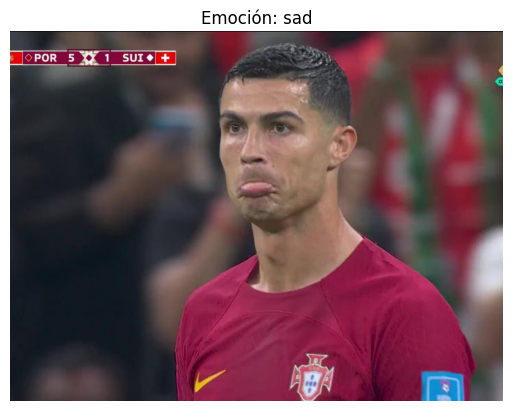

1/1 [==============================] - 0s 27ms/step


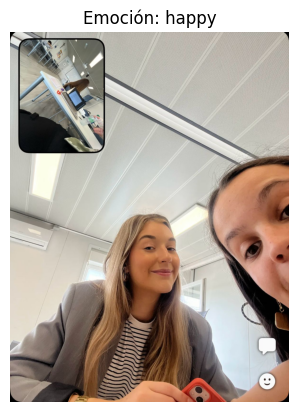

1/1 [==============================] - 0s 20ms/step


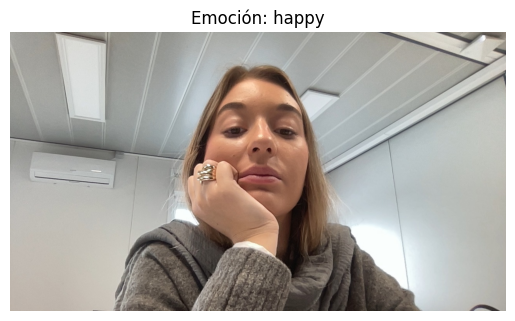

1/1 [==============================] - 0s 21ms/step


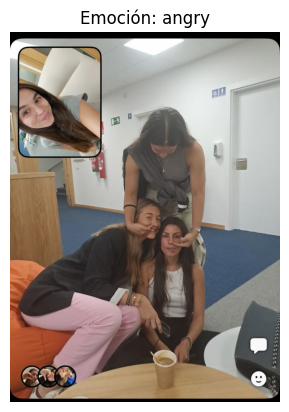

1/1 [==============================] - 0s 20ms/step


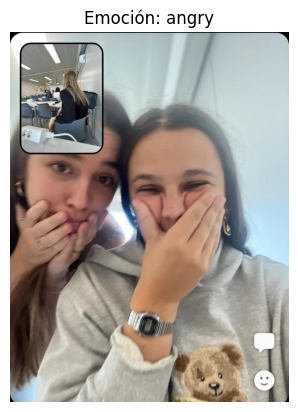

1/1 [==============================] - 0s 20ms/step


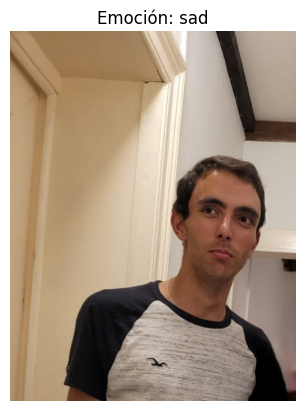

1/1 [==============================] - 0s 20ms/step


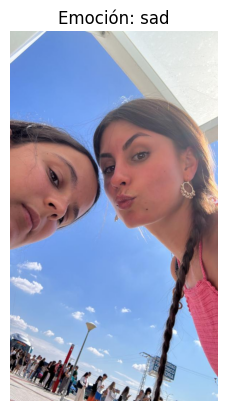

1/1 [==============================] - 0s 20ms/step


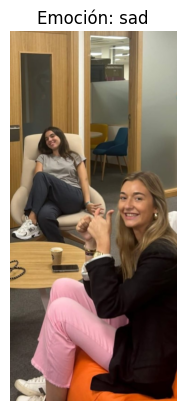

1/1 [==============================] - 0s 30ms/step


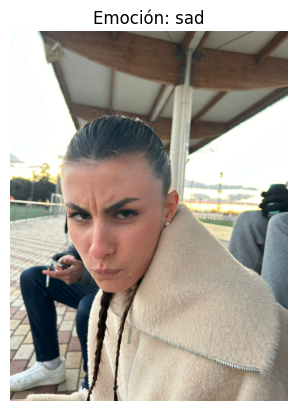

1/1 [==============================] - 0s 80ms/step


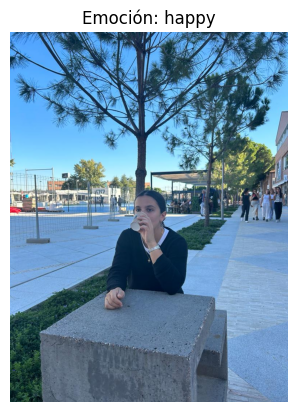

1/1 [==============================] - 0s 54ms/step


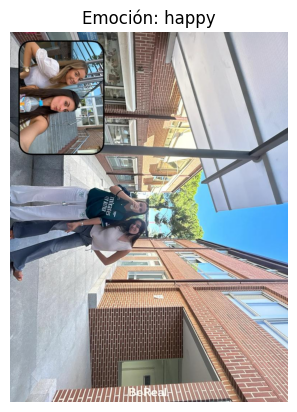

1/1 [==============================] - 0s 69ms/step


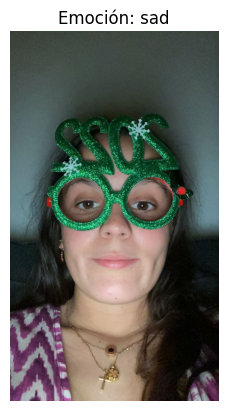

1/1 [==============================] - 0s 80ms/step


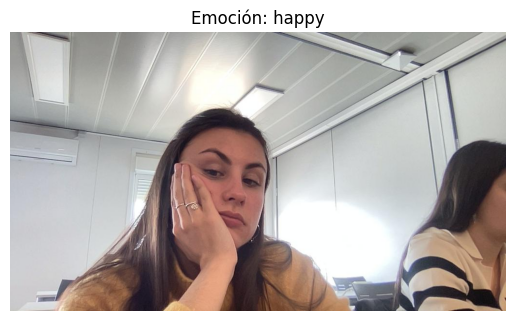

1/1 [==============================] - 0s 34ms/step


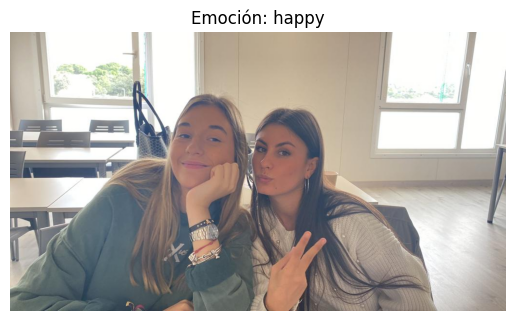

1/1 [==============================] - 0s 25ms/step


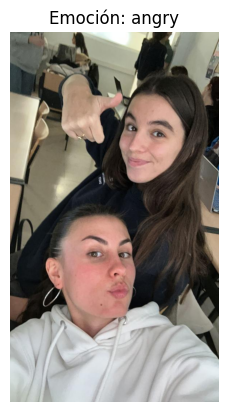

1/1 [==============================] - 0s 21ms/step


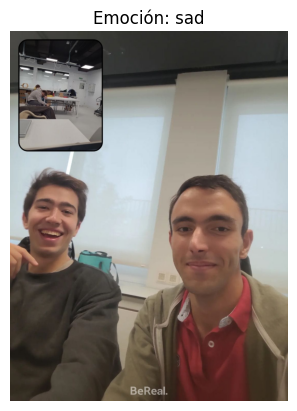

1/1 [==============================] - 0s 25ms/step


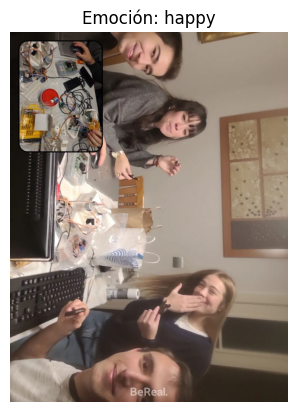

1/1 [==============================] - 0s 31ms/step


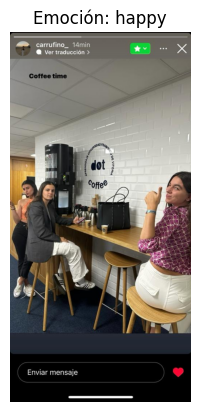

1/1 [==============================] - 0s 23ms/step


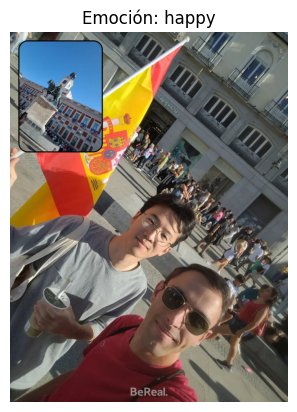

1/1 [==============================] - 0s 25ms/step


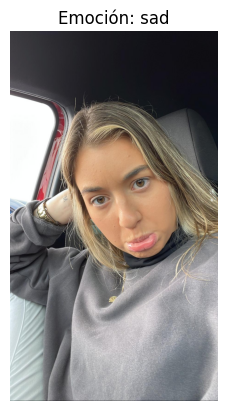

In [ ]:
# Ruta de la carpeta que contiene las imágenes
folder_path = '/content/drive/My Drive/faceOUR'

# Iterar a través de los archivos en la carpeta
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Construir la ruta completa de la imagen
        image_path = os.path.join(folder_path, filename)

        # Preprocesar la imagen
        img = cv2.imread(image_path)
        img = cv2.resize(img, (48, 48))
        img = np.expand_dims(img, axis=0) / 255.0

        # Realizar la predicción
        emotions = model.predict(img)
        predicted_emotion = emotion_labels[np.argmax(emotions)]

        # Mostrar la emoción predicha y la imagen
        plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f'Emoción: {predicted_emotion}')
        plt.show()

La conclusión de estas nuevas predicciones, es que al final el modelo detecta bastante bien las emociones como se pueden observar en las imágenes; pero en algunas falla un poco el modelo. Sobretodo en las imágenes en las que sale más de una cara, creemos que el modelo se cortocircuita por que ve varias caras distintas y por tanto, no predice como debería.

**En definitiva, hemos conseguido realizar el modelo de detección de emociones; no contamos con scores excelentes es por ello que tiene algunos fallos, pero entendemos que en la mayoría de las imágenes obtenemos resultados aceptables**

**4. NUEVO INTENTO CON BASE DE DATOS MUCHO MÁS GRANDE**

Este modelo es un intento que se realizó con el fin de comprobar si se podían obtener mejores resultados utilizando una notablemente mayor cantidad de datos de entrenamiento.

Se incluye en el cuaderno para enseñar el intento pero no se logró obtener mejores métricas a las anteriores vistas.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [3]:
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/Carrera/test'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/MyDrive/Carrera/test/.DS_Store
/content/drive/MyDrive/Carrera/test/sad/PublicTest_51178509.jpg
/content/drive/MyDrive/Carrera/test/sad/PrivateTest_79128619.jpg
/content/drive/MyDrive/Carrera/test/sad/PrivateTest_40329773.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_34850619.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_43202166.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_19663674.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_92862287.jpg
/content/drive/MyDrive/Carrera/test/sad/PrivateTest_89415313.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_53807292.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_99688200.jpg
/content/drive/MyDrive/Carrera/test/sad/PrivateTest_69126156.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_15977663.jpg
/content/drive/MyDrive/Carrera/test/sad/PrivateTest_12304340.jpg
/content/drive/MyDrive/Carrera/test/sad/PrivateTest_30087405.jpg
/content/drive/MyDrive/Carrera/test/sad/PublicTest_6

In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fastai.data.all import *
from fastai.vision.all import *

In [5]:
# Listar el contenido del directorio especificado por data_dir para manipular las rutas de archivo de manera más eficiente.
data_dir = '/content/drive/MyDrive/Carrera/test'
!ls "{data_dir}"

angry  happy  sad


In [6]:
def generate_data_paths(data_dir):
  # Inicializa listas para almacenar rutas de archivos y etiquetas
    path = []
    labels = []
  #  Obtenemos la lista de elementos (archivos y subdirectorios) en el directorio principal
    folds = os.listdir(data_dir)

    # Bucle que itera sobre cada elemento en el directorio principal
    for fold in folds:
        foldpath = os.path.join(data_dir, fold) # Crea la ruta completa al elemento (archivo o subdirectorio)

        if os.path.isdir(foldpath):  # Comprueba si es un subdirectorio
            filelist = os.listdir(foldpath) # Obtiene la lista de archivos en el subdirectorio
            # Bucle que itera sobre cada archivo en el subdirectorio
            for file in filelist:
                fpath = os.path.join(foldpath, file)  # Crea la ruta completa al archivo
                path.append(fpath) # Agrega la ruta del archivo a la lista de rutas
                labels.append(fold) # Agrega la etiqueta del subdirectorio a la lista de etiquetas

    return path, labels

In [7]:
import os
import pandas as pd

# Definimos las variables 'path' y 'labels' con la función que acabamos de crear 'generate_data_paths'
path, labels = generate_data_paths(data_dir)

# Creamos el DataFrame utilizando las rutas de archivos y etiquetas
def create_df(filepaths, labels):
    # Creación de dos Series de pandas a partir de las listas de rutas y etiquetas
    Fseries = pd.Series(filepaths, name='path')
    Lseries = pd.Series(labels, name='labels')
    df = pd.concat([Fseries, Lseries], axis=1) # Concatenación de las dos Series para formar un DataFrame
    return df

# Llamada a la función create_df con las rutas de archivos y etiquetas
df = create_df(path, labels)

df.head() # Muestra las primeras filas del DataFrame


,path,labels
0,/content/drive/MyDrive/Carrera/test/sad/PublicTest_51178509.jpg,sad
1,/content/drive/MyDrive/Carrera/test/sad/PrivateTest_79128619.jpg,sad
2,/content/drive/MyDrive/Carrera/test/sad/PrivateTest_40329773.jpg,sad
3,/content/drive/MyDrive/Carrera/test/sad/PublicTest_34850619.jpg,sad
4,/content/drive/MyDrive/Carrera/test/sad/PublicTest_43202166.jpg,sad


In [8]:
def num_of_classes(df):
  # Imprime un encabezado indicando el propósito de la salida
    print(f"The dataset has: ")
    print("="*50) #Separación
    print()

    # Blucle que itera sobre las clases únicas en la columna 'labels' del DataFrame
    for name in df['labels'].unique():
        num_class = len(df['labels'][df['labels'] == name]) # Calcula el número de imágenes asociadas a cada clase
        print(f"Class '{name}' has {num_class} images") # Imprime información sobre la clase actual y su cantidad de imágenes
        print('-'*50)
    print(f"\nThe dataset has {len(df['labels'].unique())} classes and {df.shape[0]} images.") # Imprime el número total de clases y la cantidad total de imágenes en el DataFrame

# Llama a la función con el DataFrame df
num_of_classes(df)

The dataset has: 

Class 'sad' has 1247 images
--------------------------------------------------
Class 'happy' has 1177 images
--------------------------------------------------
Class 'angry' has 958 images
--------------------------------------------------

The dataset has 3 classes and 3382 images.


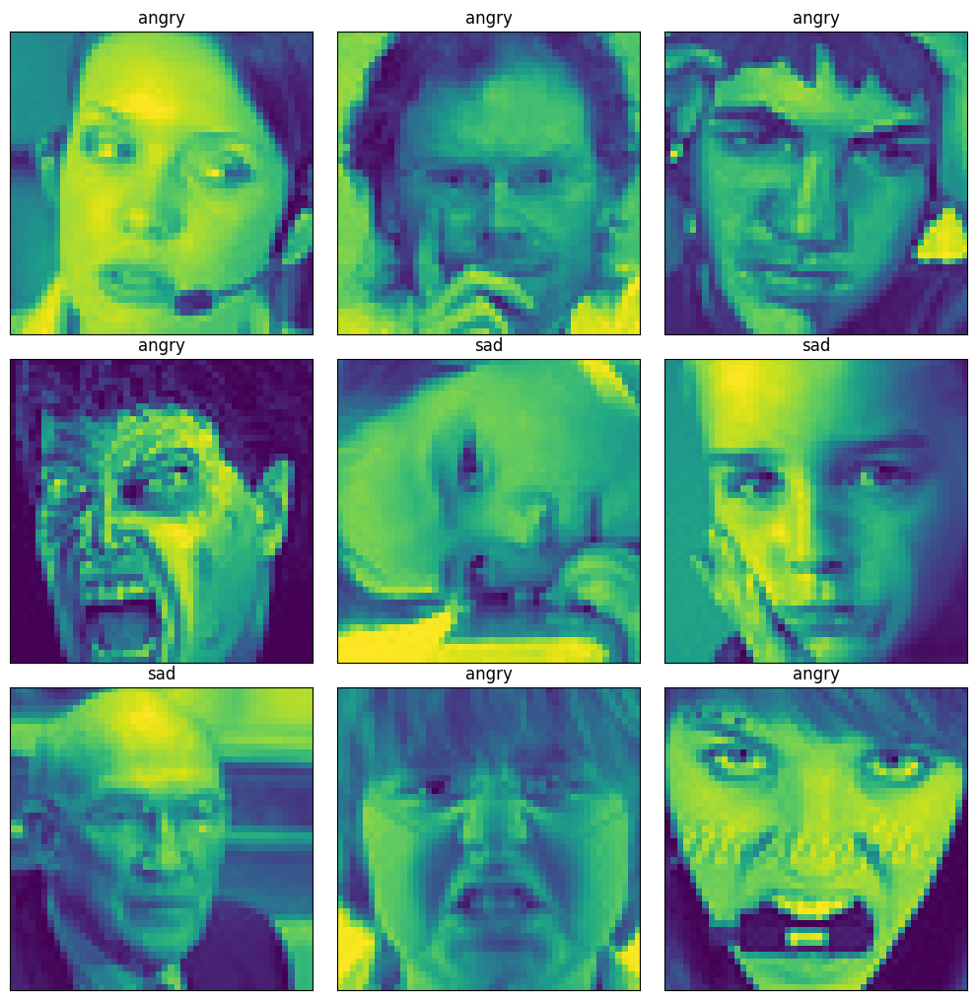

In [9]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import random

# Crea una figura con una cuadrícula de 3x3 para mostrar las imágenes
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

# Bucle que itera sobre los ejes (subgráficos) de la cuadrícula
for i, ax in enumerate(axes.flat):
    # Selecciona una muestra aleatoria del DataFrame
    random_index = random.randint(0, len(df) - 1)
    img_path = df.path[random_index]
    img_label = df.labels[random_index]

    # Carga y muestra la imagen
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.set_title(img_label, fontsize=12)

plt.tight_layout(pad=0.2) # Ajusta el diseño de la figura para evitar superposiciones
plt.show() # Muestra la figura con la cuadrícula de imágenes

In [10]:
import numpy as np
import cv2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D
from keras.optimizers import Adam
from keras.layers import MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator

In [11]:
#Normalización de los datos para poder usar un modelo preentrenado.

train_img_datagen= ImageDataGenerator(rescale=1./255) # Configuración del generador de datos de entrenamiento
val_img_datagen= ImageDataGenerator(rescale=1./255) # Configuración del generador de datos de validación

# Creación del generador de datos de entrenamiento (train_set)
train_set= train_img_datagen.flow_from_directory(
    '/content/drive/MyDrive/Carrera/test', # Directorio que contiene las imágenes de entrenamiento
    target_size=(48,48), # Tamaño de destino de las imágenes (48x48 píxeles en este caso)
    batch_size=64, # Tamaño del lote (64 imágenes por lote)
    color_mode='rgb',  # Modo de color (en este caso, RGB)
    class_mode='categorical') # Modo de clase (en este caso, clasificación categórica)

# Creación del generador de datos de validación (val_set)
val_set=val_img_datagen.flow_from_directory(
    '/content/drive/MyDrive/Carrera/test',
    target_size=(48,48),
    batch_size=64,
    color_mode='rgb',
    class_mode='categorical')

Found 3382 images belonging to 3 classes.
Found 3382 images belonging to 3 classes.


In [12]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(48, 48, 3), padding='same'))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [13]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 48, 48, 64)        18496     
                                                                 
 max_pooling2d (MaxPooling2  (None, 24, 24, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 24, 24, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 24, 24, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 128)       0         
 g2D)                                                   

In [16]:
#Después de hacer estas modificaciones, entrenamos el modelo

train_steps = 3382//64
valid_steps = 3382//64

history = model.fit(train_set,
    epochs = 3,
    steps_per_epoch =train_steps,
    validation_data =val_set,
    validation_steps = valid_steps,
)

model_info = model.fit(train_set, steps_per_epoch=5, epochs=10, validation_data=val_set, validation_steps=112)

Epoch 1/3
52/52 [==============================] - 11s 218ms/step - loss: 1.0861 - accuracy: 0.4102 - val_loss: 1.0910 - val_accuracy: 0.3930
Epoch 2/3
52/52 [==============================] - 11s 206ms/step - loss: 1.0820 - accuracy: 0.4057 - val_loss: 1.0720 - val_accuracy: 0.4339
Epoch 3/3
52/52 [==============================] - 11s 214ms/step - loss: 1.0592 - accuracy: 0.4415 - val_loss: 1.0460 - val_accuracy: 0.4730
Epoch 1/10
5/5 [==============================] - ETA: 0s - loss: 1.0732 - accuracy: 0.4500

5/5 [==============================] - 6s 1s/step - loss: 1.0732 - accuracy: 0.4500 - val_loss: 1.0491 - val_accuracy: 0.4521
Epoch 2/10
5/5 [==============================] - 1s 107ms/step - loss: 1.0340 - accuracy: 0.4594
Epoch 3/10
5/5 [==============================] - 1s 105ms/step - loss: 1.0385 - accuracy: 0.4906
Epoch 4/10
5/5 [==============================] - 1s 107ms/step - loss: 1.0498 - accuracy: 0.4594
Epoch 5/10
5/5 [==============================] - 1s 103ms/step - loss: 1.0557 - accuracy: 0.4313
Epoch 6/10
5/5 [==============================] - 1s 111ms/step - loss: 1.0399 - accuracy: 0.4875
Epoch 7/10
5/5 [==============================] - 1s 103ms/step - loss: 1.0453 - accuracy: 0.4656
Epoch 8/10
5/5 [==============================] - 1s 101ms/step - loss: 1.0417 - accuracy: 0.4375
Epoch 9/10
5/5 [==============================] - 1s 103ms/step - loss: 1.0430 - accuracy: 0.4469
Epoch 10/10
5/5 [==============================] - 1s 97ms/step - loss: 1.0363 - accuracy:

In [17]:
model.save('modelNuevaBDD.h5')
from keras.models import load_model
model=load_model('modelNuevaBDD.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [18]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import random
import numpy as np
import cv2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D
from keras.optimizers import Adam
from keras.layers import MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet50
from keras.models import load_model

1/1 [==============================] - 1s 673ms/step
Probabilidades de cada clase:
0: 0.3482
1: 0.2355
2: 0.4163


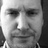

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3248
1: 0.3877
2: 0.2875


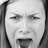

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3174
1: 0.3663
2: 0.3163


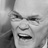

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.4419
1: 0.1760
2: 0.3821


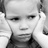

Emoción: angry
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.3448
1: 0.2738
2: 0.3814


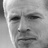

Emoción: sad
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.4286
1: 0.1506
2: 0.4209


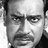

Emoción: angry
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3364
1: 0.3195
2: 0.3441


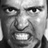

Emoción: sad
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.2959
1: 0.3924
2: 0.3116


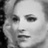

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.3226
1: 0.3122
2: 0.3652


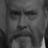

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2428
1: 0.5175
2: 0.2397


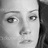

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3777
1: 0.3334
2: 0.2889


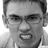

Emoción: angry
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3108
1: 0.3246
2: 0.3646


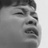

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.3705
1: 0.2081
2: 0.4214


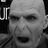

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3457
1: 0.2677
2: 0.3867


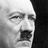

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3995
1: 0.1739
2: 0.4266


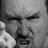

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3969
1: 0.3134
2: 0.2897


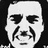

Emoción: angry
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.3883
1: 0.1903
2: 0.4214


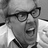

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3721
1: 0.3144
2: 0.3135


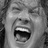

Emoción: angry
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.4158
1: 0.1461
2: 0.4381


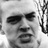

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3081
1: 0.3345
2: 0.3574


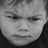

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3592
1: 0.2161
2: 0.4247


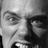

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3208
1: 0.3304
2: 0.3488


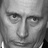

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3135
1: 0.1786
2: 0.5078


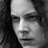

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3826
1: 0.1998
2: 0.4176


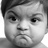

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3364
1: 0.2820
2: 0.3816


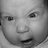

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2813
1: 0.3127
2: 0.4060


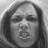

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3033
1: 0.3672
2: 0.3295


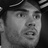

Emoción: happy
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2759
1: 0.4196
2: 0.3045


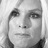

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2668
1: 0.5191
2: 0.2141


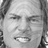

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2560
1: 0.5014
2: 0.2426


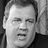

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2792
1: 0.4693
2: 0.2516


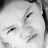

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.4182
1: 0.1411
2: 0.4407


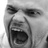

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3171
1: 0.2778
2: 0.4050


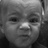

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.3725
1: 0.2750
2: 0.3525


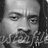

Emoción: angry
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2916
1: 0.3939
2: 0.3145


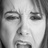

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2904
1: 0.2791
2: 0.4305


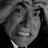

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2783
1: 0.4198
2: 0.3019


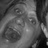

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3587
1: 0.2016
2: 0.4397


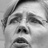

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2507
1: 0.4759
2: 0.2734


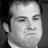

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2866
1: 0.3983
2: 0.3151


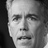

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3528
1: 0.1949
2: 0.4523


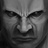

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2590
1: 0.3471
2: 0.3939


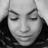

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.4001
1: 0.3023
2: 0.2975


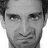

Emoción: angry
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2722
1: 0.4595
2: 0.2682


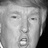

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3238
1: 0.3725
2: 0.3037


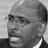

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3293
1: 0.2919
2: 0.3789


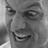

Emoción: sad
1/1 [==============================] - 0s 123ms/step
Probabilidades de cada clase:
0: 0.2963
1: 0.3306
2: 0.3731


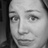

Emoción: sad
1/1 [==============================] - 0s 52ms/step
Probabilidades de cada clase:
0: 0.4128
1: 0.1336
2: 0.4535


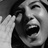

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3393
1: 0.1278
2: 0.5329


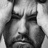

Emoción: sad
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2572
1: 0.4937
2: 0.2491


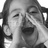

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3701
1: 0.1952
2: 0.4347


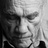

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3172
1: 0.3288
2: 0.3539


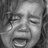

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3260
1: 0.2601
2: 0.4139


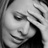

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3453
1: 0.2791
2: 0.3756


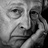

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3042
1: 0.3842
2: 0.3116


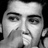

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2474
1: 0.5150
2: 0.2376


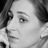

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3506
1: 0.2815
2: 0.3679


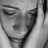

Emoción: sad
1/1 [==============================] - 0s 36ms/step
Probabilidades de cada clase:
0: 0.3574
1: 0.2993
2: 0.3432


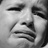

Emoción: angry
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.3551
1: 0.2432
2: 0.4017


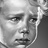

Emoción: sad
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.2175
1: 0.5605
2: 0.2220


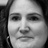

Emoción: happy
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.3348
1: 0.2317
2: 0.4336


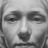

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.3596
1: 0.1924
2: 0.4480


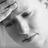

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3769
1: 0.2696
2: 0.3535


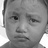

Emoción: angry
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.2520
1: 0.3383
2: 0.4097


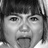

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.2576
1: 0.4836
2: 0.2588


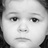

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3010
1: 0.2211
2: 0.4779


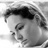

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3446
1: 0.2339
2: 0.4216


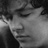

Emoción: sad
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.1899
1: 0.6293
2: 0.1809


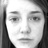

Emoción: happy
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.3792
1: 0.2351
2: 0.3857


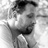

Emoción: sad
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.3480
1: 0.1986
2: 0.4534


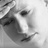

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.3234
1: 0.2615
2: 0.4151


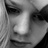

Emoción: sad
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.1765
1: 0.1369
2: 0.6866


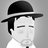

Emoción: sad
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.3276
1: 0.2796
2: 0.3928


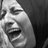

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.3745
1: 0.1826
2: 0.4430


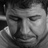

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.3668
1: 0.2383
2: 0.3949


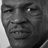

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3698
1: 0.3040
2: 0.3261


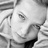

Emoción: angry
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2885
1: 0.4205
2: 0.2910


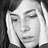

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3575
1: 0.2989
2: 0.3436


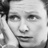

Emoción: angry
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3545
1: 0.2724
2: 0.3732


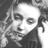

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3857
1: 0.2269
2: 0.3874


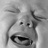

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2618
1: 0.4092
2: 0.3290


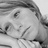

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3254
1: 0.2633
2: 0.4114


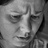

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3298
1: 0.1670
2: 0.5032


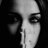

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2035
1: 0.5812
2: 0.2152


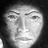

Emoción: happy
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.3057
1: 0.4264
2: 0.2679


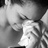

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3023
1: 0.4022
2: 0.2955


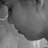

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2989
1: 0.3409
2: 0.3603


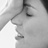

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3282
1: 0.1808
2: 0.4910


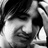

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3514
1: 0.3031
2: 0.3455


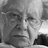

Emoción: angry
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2533
1: 0.2590
2: 0.4877


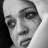

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.4141
1: 0.1722
2: 0.4137


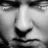

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2311
1: 0.2584
2: 0.5105


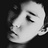

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3975
1: 0.1833
2: 0.4192


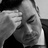

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2239
1: 0.5597
2: 0.2164


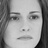

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3617
1: 0.2846
2: 0.3537


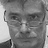

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2871
1: 0.3908
2: 0.3222


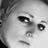

Emoción: happy
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3198
1: 0.2759
2: 0.4042


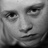

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3436
1: 0.2384
2: 0.4179


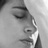

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3872
1: 0.2045
2: 0.4083


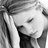

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2955
1: 0.4140
2: 0.2904


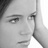

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2896
1: 0.3801
2: 0.3303


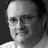

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3372
1: 0.3248
2: 0.3380


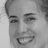

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2647
1: 0.4519
2: 0.2834


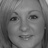

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2886
1: 0.4332
2: 0.2783


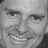

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3568
1: 0.3483
2: 0.2949


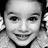

Emoción: angry
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3176
1: 0.1610
2: 0.5214


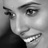

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2425
1: 0.4850
2: 0.2725


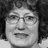

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3214
1: 0.3950
2: 0.2836


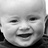

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3321
1: 0.2587
2: 0.4093


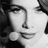

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3657
1: 0.2816
2: 0.3528


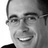

Emoción: angry
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3585
1: 0.2984
2: 0.3431


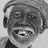

Emoción: angry
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2364
1: 0.5119
2: 0.2517


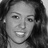

Emoción: happy
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.2573
1: 0.5123
2: 0.2305


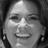

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3255
1: 0.3354
2: 0.3391


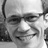

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2972
1: 0.3170
2: 0.3858


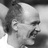

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2361
1: 0.5778
2: 0.1861


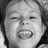

Emoción: happy
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.3199
1: 0.2061
2: 0.4740


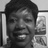

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2506
1: 0.4563
2: 0.2931


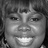

Emoción: happy
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2725
1: 0.4700
2: 0.2575


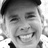

Emoción: happy
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2945
1: 0.4249
2: 0.2806


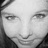

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3466
1: 0.2455
2: 0.4079


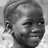

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.3274
1: 0.2895
2: 0.3831


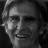

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3640
1: 0.2831
2: 0.3529


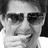

Emoción: angry
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2488
1: 0.4979
2: 0.2533


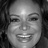

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3361
1: 0.4036
2: 0.2603


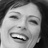

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3220
1: 0.3558
2: 0.3222


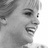

Emoción: happy
1/1 [==============================] - 0s 56ms/step
Probabilidades de cada clase:
0: 0.3156
1: 0.4393
2: 0.2450


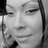

Emoción: happy
1/1 [==============================] - 0s 38ms/step
Probabilidades de cada clase:
0: 0.3133
1: 0.3619
2: 0.3248


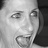

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2615
1: 0.3889
2: 0.3496


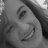

Emoción: happy
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.2666
1: 0.3433
2: 0.3901


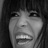

Emoción: sad
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.2185
1: 0.6000
2: 0.1815


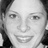

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2265
1: 0.5454
2: 0.2282


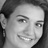

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.3346
1: 0.3466
2: 0.3188


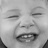

Emoción: happy
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2715
1: 0.4363
2: 0.2922


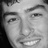

Emoción: happy
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2009
1: 0.6155
2: 0.1836


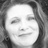

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3185
1: 0.3706
2: 0.3109


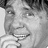

Emoción: happy
1/1 [==============================] - 0s 35ms/step
Probabilidades de cada clase:
0: 0.3275
1: 0.3773
2: 0.2951


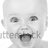

Emoción: happy
1/1 [==============================] - 0s 38ms/step
Probabilidades de cada clase:
0: 0.2354
1: 0.5341
2: 0.2305


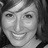

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.2208
1: 0.5205
2: 0.2587


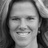

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2598
1: 0.4678
2: 0.2724


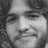

Emoción: happy
1/1 [==============================] - 0s 40ms/step
Probabilidades de cada clase:
0: 0.3269
1: 0.2677
2: 0.4053


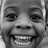

Emoción: sad
1/1 [==============================] - 0s 40ms/step
Probabilidades de cada clase:
0: 0.2058
1: 0.4404
2: 0.3538


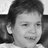

Emoción: happy
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.3345
1: 0.1618
2: 0.5037


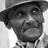

Emoción: sad
1/1 [==============================] - 0s 44ms/step
Probabilidades de cada clase:
0: 0.2644
1: 0.3187
2: 0.4169


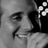

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2744
1: 0.3865
2: 0.3392


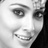

Emoción: happy
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.3348
1: 0.2912
2: 0.3740


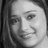

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2335
1: 0.5027
2: 0.2639


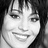

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2893
1: 0.2447
2: 0.4660


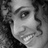

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2621
1: 0.4829
2: 0.2551


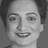

Emoción: happy
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.2831
1: 0.4199
2: 0.2970


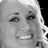

Emoción: happy


In [19]:
from google.colab.patches import cv2_imshow

root_directory = '/content/drive/MyDrive/Predicción'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)

    # Imprimir las probabilidades para cada clase
    print("Probabilidades de cada clase:")
    for label, probabilidad in zip(emotion_labels, emotions[0]):
        print(f'{label}: {probabilidad:.4f}')

    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')


In [20]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

53/53 [==============================] - 5s 95ms/step
F1-score: 0.3250032213943095


In [21]:
from sklearn.metrics import confusion_matrix, classification_report, f1_score
# Calcular y mostrar la matriz de confusión
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = val_set.classes

conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
print("Matriz de confusión:")
print(conf_matrix)

# Imprimir el reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_true_classes, y_pred_classes))

Matriz de confusión:
[[ 92 461 405]
 [114 547 516]
 [135 573 539]]
Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.27      0.10      0.14       958
           1       0.35      0.46      0.40      1177
           2       0.37      0.43      0.40      1247

    accuracy                           0.35      3382
   macro avg       0.33      0.33      0.31      3382
weighted avg       0.33      0.35      0.33      3382



Seguimos entrenando el modelo en busca de mejores resultados

In [22]:
train_steps = 3382//64
valid_steps = 3382//64

history = model.fit(train_set,
    epochs = 3,
    steps_per_epoch =train_steps,
    validation_data =val_set,
    validation_steps = valid_steps,
)

model_info = model.fit(train_set, steps_per_epoch=5, epochs=10, validation_data=val_set, validation_steps=112)

Epoch 1/3
52/52 [==============================] - 13s 207ms/step - loss: 1.0131 - accuracy: 0.4916 - val_loss: 0.9887 - val_accuracy: 0.5228
Epoch 2/3
52/52 [==============================] - 10s 195ms/step - loss: 0.9889 - accuracy: 0.5235 - val_loss: 0.9502 - val_accuracy: 0.5385
Epoch 3/3
52/52 [==============================] - 11s 206ms/step - loss: 0.9616 - accuracy: 0.5338 - val_loss: 0.9277 - val_accuracy: 0.5790
Epoch 1/10
5/5 [==============================] - ETA: 0s - loss: 0.9378 - accuracy: 0.5419

5/5 [==============================] - 6s 1s/step - loss: 0.9378 - accuracy: 0.5419 - val_loss: 0.9235 - val_accuracy: 0.5727
Epoch 2/10
5/5 [==============================] - 1s 128ms/step - loss: 0.9459 - accuracy: 0.5375
Epoch 3/10
5/5 [==============================] - 1s 111ms/step - loss: 0.9425 - accuracy: 0.5625
Epoch 4/10
5/5 [==============================] - 1s 121ms/step - loss: 0.9329 - accuracy: 0.5688
Epoch 5/10
5/5 [==============================] - 1s 112ms/step - loss: 0.9232 - accuracy: 0.5750
Epoch 6/10
5/5 [==============================] - 1s 106ms/step - loss: 0.8781 - accuracy: 0.5813
Epoch 7/10
5/5 [==============================] - 1s 98ms/step - loss: 0.9145 - accuracy: 0.5625
Epoch 8/10
5/5 [==============================] - 1s 100ms/step - loss: 0.8973 - accuracy: 0.5581
Epoch 9/10
5/5 [==============================] - 1s 105ms/step - loss: 0.9494 - accuracy: 0.5594
Epoch 10/10
5/5 [==============================] - 1s 99ms/step - loss: 0.9355 - accuracy: 

In [23]:
model.save('modelNuevaBDD.h5')
from keras.models import load_model
model=load_model('modelNuevaBDD.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 88ms/step
Probabilidades de cada clase:
0: 0.4161
1: 0.1636
2: 0.4203


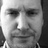

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.4825
1: 0.1139
2: 0.4036


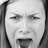

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1733
1: 0.6951
2: 0.1315


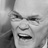

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.5608
1: 0.0652
2: 0.3740


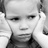

Emoción: angry
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3478
1: 0.1535
2: 0.4988


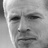

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.4765
1: 0.0287
2: 0.4948


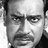

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3434
1: 0.4655
2: 0.1911


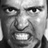

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.2337
1: 0.4779
2: 0.2884


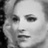

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3108
1: 0.3296
2: 0.3596


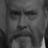

Emoción: sad
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.2798
1: 0.3681
2: 0.3521


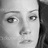

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.5751
1: 0.1883
2: 0.2366


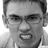

Emoción: angry
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2833
1: 0.4000
2: 0.3168


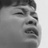

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.4266
1: 0.1067
2: 0.4667


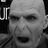

Emoción: sad
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.4062
1: 0.1799
2: 0.4139


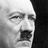

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3812
1: 0.0982
2: 0.5207


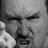

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.1126
1: 0.8713
2: 0.0162


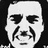

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.4455
1: 0.1031
2: 0.4514


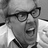

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.4112
1: 0.3723
2: 0.2165


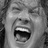

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.5576
1: 0.0392
2: 0.4032


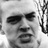

Emoción: angry
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3182
1: 0.3089
2: 0.3730


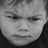

Emoción: sad
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3572
1: 0.0627
2: 0.5801


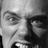

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3348
1: 0.1077
2: 0.5575


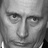

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2092
1: 0.0886
2: 0.7022


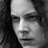

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.4367
1: 0.0919
2: 0.4714


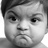

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3385
1: 0.0989
2: 0.5626


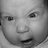

Emoción: sad
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.2489
1: 0.1802
2: 0.5709


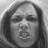

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2818
1: 0.4830
2: 0.2353


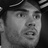

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3059
1: 0.2313
2: 0.4628


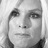

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2085
1: 0.6838
2: 0.1077


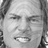

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2109
1: 0.6314
2: 0.1577


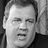

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2966
1: 0.4182
2: 0.2852


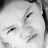

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.5439
1: 0.0676
2: 0.3885


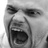

Emoción: angry
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2903
1: 0.1657
2: 0.5440


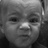

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.4554
1: 0.1736
2: 0.3710


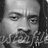

Emoción: angry
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3299
1: 0.1872
2: 0.4829


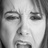

Emoción: sad
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.2950
1: 0.3221
2: 0.3829


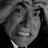

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2082
1: 0.5061
2: 0.2856


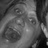

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3735
1: 0.0593
2: 0.5672


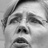

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2242
1: 0.4583
2: 0.3176


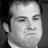

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.3061
1: 0.1159
2: 0.5780


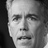

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3476
1: 0.1606
2: 0.4918


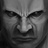

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2076
1: 0.4103
2: 0.3821


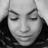

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4617
1: 0.2999
2: 0.2384


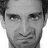

Emoción: angry
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.3307
1: 0.2458
2: 0.4235


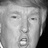

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2861
1: 0.3747
2: 0.3392


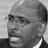

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3128
1: 0.3904
2: 0.2968


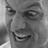

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2435
1: 0.1931
2: 0.5634


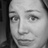

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.4897
1: 0.1096
2: 0.4007


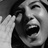

Emoción: angry
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2867
1: 0.0282
2: 0.6851


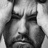

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2216
1: 0.5349
2: 0.2435


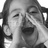

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3249
1: 0.2087
2: 0.4663


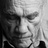

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3453
1: 0.1362
2: 0.5185


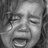

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.2498
1: 0.1666
2: 0.5836


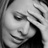

Emoción: sad
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.3947
1: 0.2495
2: 0.3559


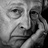

Emoción: angry
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.2721
1: 0.5379
2: 0.1900


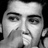

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2039
1: 0.4911
2: 0.3051


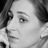

Emoción: happy
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.4550
1: 0.1550
2: 0.3900


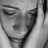

Emoción: angry
1/1 [==============================] - 0s 24ms/step
Probabilidades de cada clase:
0: 0.3438
1: 0.5013
2: 0.1549


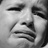

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.3897
1: 0.0989
2: 0.5115


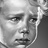

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.0769
1: 0.8677
2: 0.0554


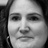

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3138
1: 0.0496
2: 0.6365


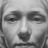

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2999
1: 0.1227
2: 0.5773


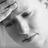

Emoción: sad
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.4100
1: 0.1766
2: 0.4135


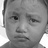

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1940
1: 0.0755
2: 0.7305


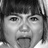

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2898
1: 0.2521
2: 0.4581


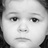

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3038
1: 0.1283
2: 0.5679


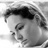

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.3371
1: 0.1654
2: 0.4975


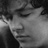

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.2569
1: 0.4471
2: 0.2960


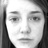

Emoción: happy
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.4528
1: 0.2920
2: 0.2552


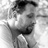

Emoción: angry
1/1 [==============================] - 0s 35ms/step
Probabilidades de cada clase:
0: 0.2676
1: 0.1282
2: 0.6042


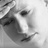

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3206
1: 0.2298
2: 0.4496


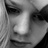

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.0507
1: 0.0206
2: 0.9286


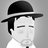

Emoción: sad
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.2797
1: 0.2668
2: 0.4534


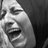

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3679
1: 0.1214
2: 0.5107


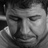

Emoción: sad
1/1 [==============================] - 0s 37ms/step
Probabilidades de cada clase:
0: 0.3826
1: 0.1664
2: 0.4510


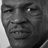

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.4208
1: 0.1215
2: 0.4578


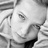

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.3540
1: 0.2049
2: 0.4410


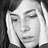

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3980
1: 0.1472
2: 0.4548


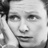

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2678
1: 0.2781
2: 0.4541


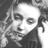

Emoción: sad
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.3930
1: 0.1594
2: 0.4476


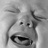

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2532
1: 0.2177
2: 0.5291


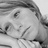

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2902
1: 0.1334
2: 0.5764


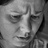

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2740
1: 0.1476
2: 0.5784


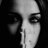

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.1244
1: 0.7280
2: 0.1476


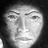

Emoción: happy
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.1976
1: 0.6563
2: 0.1460


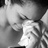

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2772
1: 0.4726
2: 0.2503


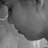

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3046
1: 0.1966
2: 0.4988


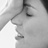

Emoción: sad
1/1 [==============================] - 0s 57ms/step
Probabilidades de cada clase:
0: 0.2714
1: 0.1107
2: 0.6179


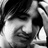

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.3899
1: 0.3117
2: 0.2985


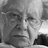

Emoción: angry
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.1483
1: 0.0747
2: 0.7770


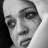

Emoción: sad
1/1 [==============================] - 0s 40ms/step
Probabilidades de cada clase:
0: 0.5374
1: 0.1050
2: 0.3577


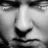

Emoción: angry
1/1 [==============================] - 0s 51ms/step
Probabilidades de cada clase:
0: 0.1240
1: 0.1230
2: 0.7530


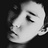

Emoción: sad
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.4719
1: 0.0960
2: 0.4321


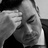

Emoción: angry
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2268
1: 0.5692
2: 0.2040


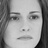

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4441
1: 0.1459
2: 0.4100


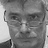

Emoción: angry
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.2854
1: 0.1583
2: 0.5563


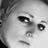

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.3599
1: 0.1672
2: 0.4728


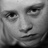

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3820
1: 0.0984
2: 0.5195


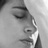

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4013
1: 0.0716
2: 0.5271


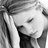

Emoción: sad
1/1 [==============================] - 0s 40ms/step
Probabilidades de cada clase:
0: 0.3077
1: 0.3388
2: 0.3535


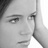

Emoción: sad
1/1 [==============================] - 0s 63ms/step
Probabilidades de cada clase:
0: 0.2417
1: 0.2276
2: 0.5307


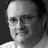

Emoción: sad
1/1 [==============================] - 0s 53ms/step
Probabilidades de cada clase:
0: 0.3697
1: 0.3205
2: 0.3098


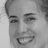

Emoción: angry
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.2031
1: 0.5559
2: 0.2410


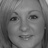

Emoción: happy
1/1 [==============================] - 0s 59ms/step
Probabilidades de cada clase:
0: 0.1768
1: 0.6782
2: 0.1450


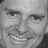

Emoción: happy
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.1957
1: 0.7283
2: 0.0760


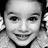

Emoción: happy
1/1 [==============================] - 0s 40ms/step
Probabilidades de cada clase:
0: 0.2935
1: 0.0948
2: 0.6117


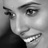

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.1388
1: 0.6596
2: 0.2016


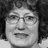

Emoción: happy
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.2211
1: 0.6844
2: 0.0944


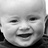

Emoción: happy
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.3943
1: 0.0955
2: 0.5102


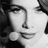

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.4882
1: 0.1797
2: 0.3321


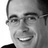

Emoción: angry
1/1 [==============================] - 0s 44ms/step
Probabilidades de cada clase:
0: 0.3422
1: 0.4515
2: 0.2062


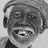

Emoción: happy
1/1 [==============================] - 0s 42ms/step
Probabilidades de cada clase:
0: 0.2014
1: 0.5214
2: 0.2772


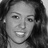

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.1282
1: 0.7735
2: 0.0984


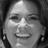

Emoción: happy
1/1 [==============================] - 0s 59ms/step
Probabilidades de cada clase:
0: 0.1748
1: 0.6570
2: 0.1682


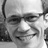

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.2023
1: 0.2963
2: 0.5014


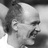

Emoción: sad
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.1098
1: 0.8361
2: 0.0541


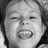

Emoción: happy
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.2947
1: 0.3649
2: 0.3404


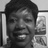

Emoción: happy
1/1 [==============================] - 0s 36ms/step
Probabilidades de cada clase:
0: 0.1396
1: 0.7069
2: 0.1535


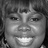

Emoción: happy
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.1340
1: 0.7861
2: 0.0799


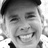

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.3837
1: 0.2357
2: 0.3806


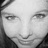

Emoción: angry
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2619
1: 0.1523
2: 0.5858


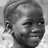

Emoción: sad
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.2940
1: 0.3351
2: 0.3709


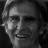

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2979
1: 0.4182
2: 0.2838


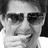

Emoción: happy
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.1226
1: 0.7657
2: 0.1117


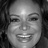

Emoción: happy
1/1 [==============================] - 0s 54ms/step
Probabilidades de cada clase:
0: 0.2447
1: 0.6251
2: 0.1302


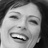

Emoción: happy
1/1 [==============================] - 0s 42ms/step
Probabilidades de cada clase:
0: 0.3857
1: 0.2277
2: 0.3866


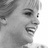

Emoción: sad
1/1 [==============================] - 0s 43ms/step
Probabilidades de cada clase:
0: 0.4871
1: 0.2655
2: 0.2474


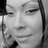

Emoción: angry
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.3573
1: 0.2333
2: 0.4094


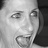

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.2068
1: 0.3801
2: 0.4131


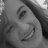

Emoción: sad
1/1 [==============================] - 0s 48ms/step
Probabilidades de cada clase:
0: 0.1744
1: 0.5663
2: 0.2593


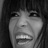

Emoción: happy
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.1776
1: 0.7128
2: 0.1096


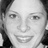

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.1710
1: 0.6671
2: 0.1618


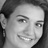

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.3273
1: 0.4453
2: 0.2274


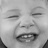

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.3199
1: 0.1667
2: 0.5133


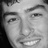

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.1796
1: 0.6984
2: 0.1220


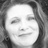

Emoción: happy
1/1 [==============================] - 0s 45ms/step
Probabilidades de cada clase:
0: 0.3118
1: 0.4232
2: 0.2650


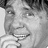

Emoción: happy
1/1 [==============================] - 0s 60ms/step
Probabilidades de cada clase:
0: 0.2377
1: 0.6027
2: 0.1596


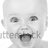

Emoción: happy
1/1 [==============================] - 0s 38ms/step
Probabilidades de cada clase:
0: 0.1553
1: 0.7118
2: 0.1328


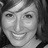

Emoción: happy
1/1 [==============================] - 0s 38ms/step
Probabilidades de cada clase:
0: 0.0994
1: 0.8098
2: 0.0909


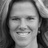

Emoción: happy
1/1 [==============================] - 0s 42ms/step
Probabilidades de cada clase:
0: 0.1640
1: 0.6710
2: 0.1649


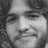

Emoción: happy
1/1 [==============================] - 0s 60ms/step
Probabilidades de cada clase:
0: 0.2629
1: 0.4884
2: 0.2487


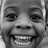

Emoción: happy
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.1413
1: 0.3778
2: 0.4809


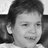

Emoción: sad
1/1 [==============================] - 0s 47ms/step
Probabilidades de cada clase:
0: 0.2576
1: 0.0375
2: 0.7050


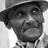

Emoción: sad
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.1759
1: 0.4701
2: 0.3541


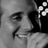

Emoción: happy
1/1 [==============================] - 0s 65ms/step
Probabilidades de cada clase:
0: 0.2508
1: 0.4187
2: 0.3305


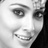

Emoción: happy
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.3020
1: 0.2967
2: 0.4013


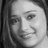

Emoción: sad
1/1 [==============================] - 0s 68ms/step
Probabilidades de cada clase:
0: 0.1043
1: 0.8149
2: 0.0808


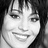

Emoción: happy
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.1825
1: 0.1760
2: 0.6415


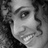

Emoción: sad
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.1914
1: 0.6463
2: 0.1623


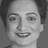

Emoción: happy
1/1 [==============================] - 0s 59ms/step
Probabilidades de cada clase:
0: 0.2345
1: 0.5704
2: 0.1951


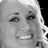

Emoción: happy


In [24]:
from google.colab.patches import cv2_imshow

root_directory = '/content/drive/MyDrive/Predicción'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)

    # Imprimir las probabilidades para cada clase
    print("Probabilidades de cada clase:")
    for label, probabilidad in zip(emotion_labels, emotions[0]):
        print(f'{label}: {probabilidad:.4f}')

    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')


In [25]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

53/53 [==============================] - 7s 125ms/step
F1-score: 0.3278530492162103


In [26]:
from sklearn.metrics import confusion_matrix, classification_report, f1_score
# Calcular y mostrar la matriz de confusión
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = val_set.classes

conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
print("Matriz de confusión:")
print(conf_matrix)

# Imprimir el reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_true_classes, y_pred_classes))

Matriz de confusión:
[[127 372 459]
 [176 444 557]
 [183 473 591]]
Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.26      0.13      0.18       958
           1       0.34      0.38      0.36      1177
           2       0.37      0.47      0.41      1247

    accuracy                           0.34      3382
   macro avg       0.32      0.33      0.32      3382
weighted avg       0.33      0.34      0.33      3382



Añadimos otra vuelta de entrenamiento en busca de mejora de predicción

In [28]:
train_steps = 3382//64
valid_steps = 3382//64

history = model.fit(train_set,
    epochs = 3,
    steps_per_epoch =train_steps,
    validation_data =val_set,
    validation_steps = valid_steps,
)

model_info = model.fit(train_set, steps_per_epoch=5, epochs=10, validation_data=val_set, validation_steps=112)

Epoch 1/3
52/52 [==============================] - 15s 288ms/step - loss: 0.8687 - accuracy: 0.5913 - val_loss: 0.8174 - val_accuracy: 0.6349
Epoch 2/3
52/52 [==============================] - 10s 198ms/step - loss: 0.8452 - accuracy: 0.6118 - val_loss: 0.8214 - val_accuracy: 0.6289
Epoch 3/3
52/52 [==============================] - 10s 190ms/step - loss: 0.8215 - accuracy: 0.6233 - val_loss: 0.7712 - val_accuracy: 0.6596
Epoch 1/10
5/5 [==============================] - ETA: 0s - loss: 0.8069 - accuracy: 0.6438

5/5 [==============================] - 6s 1s/step - loss: 0.8069 - accuracy: 0.6438 - val_loss: 0.7693 - val_accuracy: 0.6564
Epoch 2/10
5/5 [==============================] - 1s 107ms/step - loss: 0.8189 - accuracy: 0.6406
Epoch 3/10
5/5 [==============================] - 1s 102ms/step - loss: 0.7822 - accuracy: 0.6562
Epoch 4/10
5/5 [==============================] - 1s 104ms/step - loss: 0.7871 - accuracy: 0.6531
Epoch 5/10
5/5 [==============================] - 1s 97ms/step - loss: 0.7777 - accuracy: 0.6562
Epoch 6/10
5/5 [==============================] - 1s 103ms/step - loss: 0.7913 - accuracy: 0.6250
Epoch 7/10
5/5 [==============================] - 1s 101ms/step - loss: 0.8167 - accuracy: 0.6065
Epoch 8/10
5/5 [==============================] - 1s 102ms/step - loss: 0.6999 - accuracy: 0.7226
Epoch 9/10
5/5 [==============================] - 1s 104ms/step - loss: 0.8318 - accuracy: 0.6094
Epoch 10/10
5/5 [==============================] - 1s 99ms/step - loss: 0.8525 - accuracy: 

In [29]:
model.save('modelNuevaBDD.h5')
from keras.models import load_model
model=load_model('modelNuevaBDD.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 141ms/step
Probabilidades de cada clase:
0: 0.5725
1: 0.1069
2: 0.3206


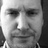

Emoción: angry
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.6834
1: 0.0221
2: 0.2945


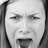

Emoción: angry
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.2210
1: 0.6187
2: 0.1604


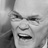

Emoción: happy
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.7285
1: 0.0168
2: 0.2547


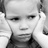

Emoción: angry
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.3017
1: 0.1207
2: 0.5776


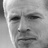

Emoción: sad
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.6609
1: 0.0039
2: 0.3352


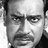

Emoción: angry
1/1 [==============================] - 0s 39ms/step
Probabilidades de cada clase:
0: 0.7358
1: 0.2077
2: 0.0565


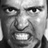

Emoción: angry
1/1 [==============================] - 0s 86ms/step
Probabilidades de cada clase:
0: 0.3064
1: 0.1663
2: 0.5273


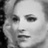

Emoción: sad
1/1 [==============================] - 0s 64ms/step
Probabilidades de cada clase:
0: 0.2734
1: 0.2903
2: 0.4363


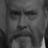

Emoción: sad
1/1 [==============================] - 0s 73ms/step
Probabilidades de cada clase:
0: 0.4035
1: 0.1728
2: 0.4237


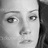

Emoción: sad
1/1 [==============================] - 0s 66ms/step
Probabilidades de cada clase:
0: 0.8243
1: 0.0658
2: 0.1100


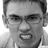

Emoción: angry
1/1 [==============================] - 0s 62ms/step
Probabilidades de cada clase:
0: 0.2680
1: 0.5109
2: 0.2211


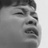

Emoción: happy
1/1 [==============================] - 0s 69ms/step
Probabilidades de cada clase:
0: 0.5639
1: 0.0313
2: 0.4048


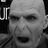

Emoción: angry
1/1 [==============================] - 0s 58ms/step
Probabilidades de cada clase:
0: 0.4897
1: 0.0449
2: 0.4654


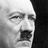

Emoción: angry
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.4135
1: 0.0381
2: 0.5485


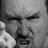

Emoción: sad
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.9004
1: 0.0883
2: 0.0113


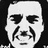

Emoción: angry
1/1 [==============================] - 0s 55ms/step
Probabilidades de cada clase:
0: 0.4888
1: 0.0650
2: 0.4462


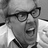

Emoción: angry
1/1 [==============================] - 0s 89ms/step
Probabilidades de cada clase:
0: 0.6822
1: 0.1596
2: 0.1582


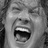

Emoción: angry
1/1 [==============================] - 0s 51ms/step
Probabilidades de cada clase:
0: 0.6335
1: 0.0083
2: 0.3582


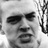

Emoción: angry
1/1 [==============================] - 0s 60ms/step
Probabilidades de cada clase:
0: 0.3795
1: 0.1528
2: 0.4677


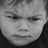

Emoción: sad
1/1 [==============================] - 0s 82ms/step
Probabilidades de cada clase:
0: 0.3827
1: 0.0320
2: 0.5853


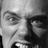

Emoción: sad
1/1 [==============================] - 0s 58ms/step
Probabilidades de cada clase:
0: 0.3641
1: 0.0272
2: 0.6087


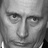

Emoción: sad
1/1 [==============================] - 0s 87ms/step
Probabilidades de cada clase:
0: 0.2239
1: 0.0335
2: 0.7426


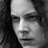

Emoción: sad
1/1 [==============================] - 0s 59ms/step
Probabilidades de cada clase:
0: 0.3889
1: 0.0137
2: 0.5975


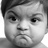

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3199
1: 0.0728
2: 0.6072


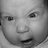

Emoción: sad
1/1 [==============================] - 0s 33ms/step
Probabilidades de cada clase:
0: 0.3000
1: 0.0904
2: 0.6096


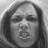

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2752
1: 0.5263
2: 0.1985


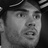

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3409
1: 0.1203
2: 0.5388


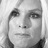

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.2328
1: 0.6852
2: 0.0820


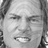

Emoción: happy
1/1 [==============================] - 0s 27ms/step
Probabilidades de cada clase:
0: 0.4178
1: 0.4976
2: 0.0846


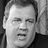

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2083
1: 0.6045
2: 0.1872


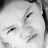

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.7584
1: 0.0313
2: 0.2102


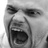

Emoción: angry
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2588
1: 0.0973
2: 0.6438


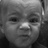

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.5686
1: 0.0438
2: 0.3876


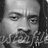

Emoción: angry
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3455
1: 0.0466
2: 0.6079


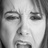

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.3954
1: 0.3114
2: 0.2932


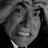

Emoción: angry
1/1 [==============================] - 0s 32ms/step
Probabilidades de cada clase:
0: 0.2142
1: 0.4067
2: 0.3791


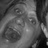

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2930
1: 0.0169
2: 0.6901


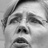

Emoción: sad
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.4397
1: 0.2382
2: 0.3221


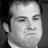

Emoción: angry
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3943
1: 0.0123
2: 0.5934


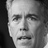

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4305
1: 0.1148
2: 0.4547


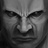

Emoción: sad
1/1 [==============================] - 0s 34ms/step
Probabilidades de cada clase:
0: 0.2359
1: 0.5421
2: 0.2220


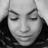

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.6613
1: 0.1696
2: 0.1691


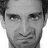

Emoción: angry
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.4283
1: 0.0653
2: 0.5064


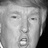

Emoción: sad
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.2081
1: 0.5466
2: 0.2453


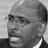

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2445
1: 0.5931
2: 0.1624


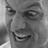

Emoción: happy
1/1 [==============================] - 0s 36ms/step
Probabilidades de cada clase:
0: 0.2082
1: 0.0889
2: 0.7029


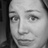

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.5253
1: 0.1349
2: 0.3398


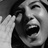

Emoción: angry
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2626
1: 0.0094
2: 0.7280


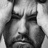

Emoción: sad
1/1 [==============================] - 0s 30ms/step
Probabilidades de cada clase:
0: 0.3844
1: 0.3632
2: 0.2524


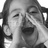

Emoción: angry
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4558
1: 0.0388
2: 0.5054


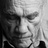

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3596
1: 0.0550
2: 0.5853


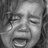

Emoción: sad
1/1 [==============================] - 0s 35ms/step
Probabilidades de cada clase:
0: 0.1152
1: 0.1034
2: 0.7815


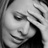

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3701
1: 0.1836
2: 0.4464


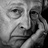

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4751
1: 0.2595
2: 0.2654


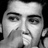

Emoción: angry
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3096
1: 0.3933
2: 0.2971


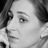

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.4969
1: 0.0602
2: 0.4429


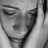

Emoción: angry
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.2831
1: 0.6658
2: 0.0510


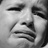

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.4222
1: 0.0462
2: 0.5316


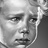

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.0312
1: 0.9437
2: 0.0251


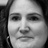

Emoción: happy
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.2698
1: 0.0135
2: 0.7167


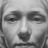

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.2003
1: 0.0951
2: 0.7046


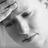

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.4058
1: 0.0779
2: 0.5163


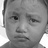

Emoción: sad
1/1 [==============================] - 0s 35ms/step
Probabilidades de cada clase:
0: 0.1447
1: 0.0412
2: 0.8141


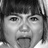

Emoción: sad
1/1 [==============================] - 0s 41ms/step
Probabilidades de cada clase:
0: 0.2476
1: 0.0770
2: 0.6754


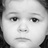

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3056
1: 0.1667
2: 0.5277


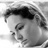

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3026
1: 0.1960
2: 0.5014


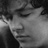

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.5363
1: 0.1336
2: 0.3301


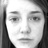

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3799
1: 0.4514
2: 0.1687


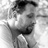

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.1830
1: 0.0897
2: 0.7273


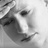

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2977
1: 0.1798
2: 0.5225


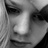

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.0509
1: 0.0739
2: 0.8752


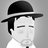

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.3458
1: 0.1714
2: 0.4828


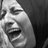

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.4595
1: 0.0809
2: 0.4597


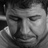

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.5047
1: 0.2252
2: 0.2701


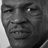

Emoción: angry
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.4332
1: 0.1315
2: 0.4353


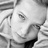

Emoción: sad
1/1 [==============================] - 0s 28ms/step
Probabilidades de cada clase:
0: 0.5461
1: 0.0773
2: 0.3766


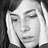

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.4241
1: 0.0400
2: 0.5359


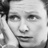

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.3082
1: 0.1166
2: 0.5753


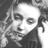

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3562
1: 0.2775
2: 0.3662


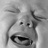

Emoción: sad
1/1 [==============================] - 0s 52ms/step
Probabilidades de cada clase:
0: 0.2385
1: 0.2412
2: 0.5203


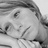

Emoción: sad
1/1 [==============================] - 0s 119ms/step
Probabilidades de cada clase:
0: 0.3300
1: 0.0834
2: 0.5866


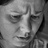

Emoción: sad
1/1 [==============================] - 0s 101ms/step
Probabilidades de cada clase:
0: 0.3387
1: 0.0423
2: 0.6189


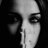

Emoción: sad
1/1 [==============================] - 0s 66ms/step
Probabilidades de cada clase:
0: 0.2114
1: 0.6519
2: 0.1367


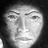

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3463
1: 0.4881
2: 0.1656


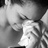

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2498
1: 0.4599
2: 0.2903


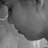

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2877
1: 0.1928
2: 0.5195


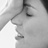

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.1133
1: 0.0624
2: 0.8243


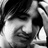

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.4911
1: 0.1317
2: 0.3772


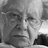

Emoción: angry
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1310
1: 0.0977
2: 0.7713


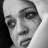

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.6274
1: 0.0788
2: 0.2938


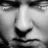

Emoción: angry
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.1541
1: 0.0667
2: 0.7792


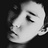

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4564
1: 0.0864
2: 0.4572


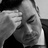

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.4349
1: 0.2472
2: 0.3179


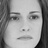

Emoción: angry
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.5231
1: 0.0590
2: 0.4179


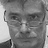

Emoción: angry
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.3256
1: 0.0639
2: 0.6105


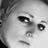

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.4180
1: 0.0928
2: 0.4892


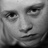

Emoción: sad
1/1 [==============================] - 0s 17ms/step
Probabilidades de cada clase:
0: 0.4364
1: 0.0598
2: 0.5038


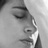

Emoción: sad
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.4831
1: 0.0317
2: 0.4852


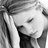

Emoción: sad
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.3127
1: 0.2161
2: 0.4713


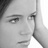

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3112
1: 0.2810
2: 0.4079


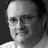

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2499
1: 0.4362
2: 0.3140


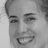

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.1887
1: 0.5373
2: 0.2740


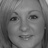

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.0794
1: 0.8340
2: 0.0866


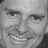

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.0944
1: 0.8979
2: 0.0076


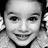

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2989
1: 0.1130
2: 0.5881


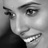

Emoción: sad
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2175
1: 0.6365
2: 0.1460


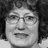

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1965
1: 0.7479
2: 0.0556


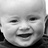

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.5628
1: 0.0359
2: 0.4013


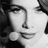

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.5638
1: 0.1800
2: 0.2562


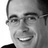

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3670
1: 0.5183
2: 0.1147


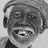

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1203
1: 0.7408
2: 0.1389


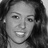

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.0838
1: 0.8744
2: 0.0418


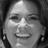

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1919
1: 0.6495
2: 0.1586


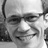

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1733
1: 0.3056
2: 0.5211


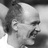

Emoción: sad
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.2096
1: 0.7479
2: 0.0425


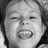

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.3367
1: 0.4665
2: 0.1968


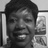

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.0925
1: 0.8395
2: 0.0680


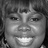

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1361
1: 0.8211
2: 0.0428


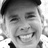

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.4590
1: 0.1438
2: 0.3972


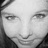

Emoción: angry
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.1628
1: 0.0866
2: 0.7505


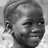

Emoción: sad
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.2232
1: 0.5919
2: 0.1850


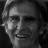

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1489
1: 0.7583
2: 0.0928


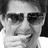

Emoción: happy
1/1 [==============================] - 0s 31ms/step
Probabilidades de cada clase:
0: 0.0434
1: 0.9317
2: 0.0249


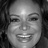

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.0852
1: 0.8819
2: 0.0329


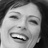

Emoción: happy
1/1 [==============================] - 0s 26ms/step
Probabilidades de cada clase:
0: 0.4439
1: 0.1380
2: 0.4181


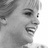

Emoción: angry
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.7787
1: 0.0736
2: 0.1477


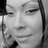

Emoción: angry
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.4066
1: 0.2607
2: 0.3328


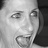

Emoción: angry
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.1496
1: 0.5069
2: 0.3435


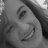

Emoción: happy
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.1187
1: 0.7710
2: 0.1103


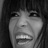

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.2342
1: 0.6791
2: 0.0867


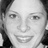

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.1461
1: 0.7582
2: 0.0957


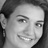

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.1532
1: 0.6932
2: 0.1536


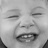

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.3149
1: 0.0755
2: 0.6096


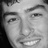

Emoción: sad
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.2134
1: 0.7482
2: 0.0384


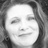

Emoción: happy
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.3223
1: 0.3973
2: 0.2804


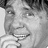

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.0923
1: 0.7975
2: 0.1102


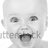

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.0924
1: 0.8603
2: 0.0474


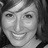

Emoción: happy
1/1 [==============================] - 0s 22ms/step
Probabilidades de cada clase:
0: 0.0576
1: 0.9139
2: 0.0286


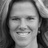

Emoción: happy
1/1 [==============================] - 0s 18ms/step
Probabilidades de cada clase:
0: 0.1104
1: 0.7662
2: 0.1234


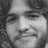

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.2350
1: 0.4997
2: 0.2653


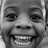

Emoción: happy
1/1 [==============================] - 0s 25ms/step
Probabilidades de cada clase:
0: 0.1115
1: 0.5325
2: 0.3560


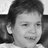

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1955
1: 0.0382
2: 0.7662


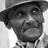

Emoción: sad
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1379
1: 0.4079
2: 0.4542


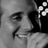

Emoción: sad
1/1 [==============================] - 0s 23ms/step
Probabilidades de cada clase:
0: 0.0549
1: 0.8838
2: 0.0613


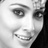

Emoción: happy
1/1 [==============================] - 0s 19ms/step
Probabilidades de cada clase:
0: 0.3194
1: 0.2056
2: 0.4750


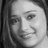

Emoción: sad
1/1 [==============================] - 0s 21ms/step
Probabilidades de cada clase:
0: 0.0143
1: 0.9826
2: 0.0031


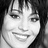

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1650
1: 0.2240
2: 0.6110


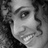

Emoción: sad
1/1 [==============================] - 0s 29ms/step
Probabilidades de cada clase:
0: 0.2167
1: 0.6544
2: 0.1289


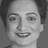

Emoción: happy
1/1 [==============================] - 0s 20ms/step
Probabilidades de cada clase:
0: 0.1066
1: 0.8126
2: 0.0808


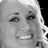

Emoción: happy


In [30]:
from google.colab.patches import cv2_imshow

root_directory = '/content/drive/MyDrive/Predicción'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)

    # Imprimir las probabilidades para cada clase
    print("Probabilidades de cada clase:")
    for label, probabilidad in zip(emotion_labels, emotions[0]):
        print(f'{label}: {probabilidad:.4f}')

    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')


In [31]:
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo en el conjunto de validación
y_pred = model.predict(val_set)

# Convertir las predicciones a etiquetas de clase
y_pred_classes = np.argmax(y_pred, axis=1)

# Obtener las verdaderas etiquetas del conjunto de validación
y_true = val_set.classes

# Calcular el F1-score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'F1-score: {f1}')

53/53 [==============================] - 5s 93ms/step
F1-score: 0.32893904688144227


In [32]:
from sklearn.metrics import confusion_matrix, classification_report, f1_score
# Calcular y mostrar la matriz de confusión
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = val_set.classes

conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
print("Matriz de confusión:")
print(conf_matrix)

# Imprimir el reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_true_classes, y_pred_classes))

Matriz de confusión:
[[269 307 382]
 [288 371 518]
 [340 431 476]]
Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.30      0.28      0.29       958
           1       0.33      0.32      0.32      1177
           2       0.35      0.38      0.36      1247

    accuracy                           0.33      3382
   macro avg       0.33      0.33      0.33      3382
weighted avg       0.33      0.33      0.33      3382



**ANEXO: MODELO CON BASE RESNET**

Este modelo dio problemas con la predicción puesto que devolvía la misma clase para cualquier imagen introducida. Creemos que se debió a un sobre entrenamiento y a un desbalance de clases en los datos.

No está ejecutado debido a la falta de tiempo de para reentrenar el modelo (en los notebooks de colab se pierden los modelos si no se descargan).

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [ ]:
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fastai.data.all import *
from fastai.vision.all import *

In [ ]:
# Listar el contenido del directorio especificado por data_dir para manipular las rutas de archivo de manera más eficiente.
data_dir = '/content/drive/MyDrive/data'
!ls "{data_dir}"

In [ ]:
def generate_data_paths(data_dir):
  # Inicializa listas para almacenar rutas de archivos y etiquetas
    path = []
    labels = []
  #  Obtenemos la lista de elementos (archivos y subdirectorios) en el directorio principal
    folds = os.listdir(data_dir)

    # Bucle que itera sobre cada elemento en el directorio principal
    for fold in folds:
        foldpath = os.path.join(data_dir, fold) # Crea la ruta completa al elemento (archivo o subdirectorio)

        if os.path.isdir(foldpath):  # Comprueba si es un subdirectorio
            filelist = os.listdir(foldpath) # Obtiene la lista de archivos en el subdirectorio
            # Bucle que itera sobre cada archivo en el subdirectorio
            for file in filelist:
                fpath = os.path.join(foldpath, file)  # Crea la ruta completa al archivo
                path.append(fpath) # Agrega la ruta del archivo a la lista de rutas
                labels.append(fold) # Agrega la etiqueta del subdirectorio a la lista de etiquetas

    return path, labels

In [ ]:
import os
import pandas as pd

# Definimos las variables 'path' y 'labels' con la función que acabamos de crear 'generate_data_paths'
path, labels = generate_data_paths(data_dir)

# Creamos el DataFrame utilizando las rutas de archivos y etiquetas
def create_df(filepaths, labels):
    # Creación de dos Series de pandas a partir de las listas de rutas y etiquetas
    Fseries = pd.Series(filepaths, name='path')
    Lseries = pd.Series(labels, name='labels')
    df = pd.concat([Fseries, Lseries], axis=1) # Concatenación de las dos Series para formar un DataFrame
    return df

# Llamada a la función create_df con las rutas de archivos y etiquetas
df = create_df(path, labels)

df.head() # Muestra las primeras filas del DataFrame


In [ ]:
def num_of_classes(df):
  # Imprime un encabezado indicando el propósito de la salida
    print(f"The dataset has: ")
    print("="*50) #Separación
    print()

    # Blucle que itera sobre las clases únicas en la columna 'labels' del DataFrame
    for name in df['labels'].unique():
        num_class = len(df['labels'][df['labels'] == name]) # Calcula el número de imágenes asociadas a cada clase
        print(f"Class '{name}' has {num_class} images") # Imprime información sobre la clase actual y su cantidad de imágenes
        print('-'*50)
    print(f"\nThe dataset has {len(df['labels'].unique())} classes and {df.shape[0]} images.") # Imprime el número total de clases y la cantidad total de imágenes en el DataFrame

# Llama a la función con el DataFrame df
num_of_classes(df)

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import random

# Crea una figura con una cuadrícula de 3x3 para mostrar las imágenes
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

# Bucle que itera sobre los ejes (subgráficos) de la cuadrícula
for i, ax in enumerate(axes.flat):
    # Selecciona una muestra aleatoria del DataFrame
    random_index = random.randint(0, len(df) - 1)
    img_path = df.path[random_index]
    img_label = df.labels[random_index]

    # Carga y muestra la imagen
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.set_title(img_label, fontsize=12)

plt.tight_layout(pad=0.2) # Ajusta el diseño de la figura para evitar superposiciones
plt.show() # Muestra la figura con la cuadrícula de imágenes

In [ ]:
mport numpy as np
import cv2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D
from keras.optimizers import Adam
from keras.layers import MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
#Normalización de los datos para poder usar un modelo preentrenado.

train_img_datagen= ImageDataGenerator(rescale=1./255) # Configuración del generador de datos de entrenamiento
val_img_datagen= ImageDataGenerator(rescale=1./255) # Configuración del generador de datos de validación

# Creación del generador de datos de entrenamiento (train_set)
train_set= train_img_datagen.flow_from_directory(
    '/content/drive/MyDrive/data', # Directorio que contiene las imágenes de entrenamiento
    target_size=(48,48), # Tamaño de destino de las imágenes (48x48 píxeles en este caso)
    batch_size=32, # Tamaño del lote (64 imágenes por lote)
    color_mode='rgb',  # Modo de color (en este caso, RGB)
    class_mode='categorical') # Modo de clase (en este caso, clasificación categórica)

# Creación del generador de datos de validación (val_set)
val_set=val_img_datagen.flow_from_directory(
    '/content/drive/MyDrive/data',
    target_size=(48,48),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical')

In [ ]:
#Se crea el modelo con base ResNet50
def build_model():
    densenet = ResNet50(
                        weights='imagenet',
                        include_top=False,
                        input_shape=(48,48,3)
                        )
    model = Sequential([densenet,
                        layers.GlobalAveragePooling2D(),
                        layers.Dense(512,activation='relu'),
                        layers.BatchNormalization(),
                        layers.Dense(3, activation='softmax')
                        ])
    model.compile(optimizer=Adam(lr=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy']
                 )
    return model

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet50
model=build_model()
model.summary()

In [ ]:
#Después de hacer estas modificaciones, entrenamos el modelo

train_steps = 264//32
valid_steps = 264//32

history = model.fit(train_set,
    epochs = 10,
    steps_per_epoch =train_steps,
    validation_data =val_set,
    validation_steps = valid_steps,
)

model_info = model.fit(train_set, steps_per_epoch=5, epochs=50, validation_data=val_set, validation_steps=112)

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import random
import numpy as np
import cv2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D
from keras.optimizers import Adam
from keras.layers import MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet50
from keras.models import load_model

In [ ]:
from google.colab.patches import cv2_imshow

root_directory = '/content/drive/MyDrive/data'
emotion_labels = {0: 'angry', 1: 'happy', 2: 'sad'}

# Función para cargar y analizar una imagen
def analyze_emotion(image_path, model):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (48, 48))
    img_display = img.copy()  # Crear una copia para mostrar la imagen original

    img = np.expand_dims(img, axis=0) / 255.0  # Normalizar la imagen
    emotions = model.predict(img)

    # Imprimir las probabilidades para cada clase
    print("Probabilidades de cada clase:")
    for label, probabilidad in zip(emotion_labels, emotions[0]):
        print(f'{label}: {probabilidad:.4f}')

    emotion_label = emotion_labels[np.argmax(emotions)]

    # Mostrar la imagen con la etiqueta de emoción
    cv2_imshow(img_display)

    return emotion_label

for subdir, _, files in os.walk(root_directory):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            image_path = os.path.join(subdir, file)
            emotion_label = analyze_emotion(image_path, model)
            print(f'Emoción: {emotion_label}')

Paula Pena, Carlota Rufino, Lola del Brío, María Revuelta y FernandO Pocino - 4ºIngeniería Biomédica